<a href="https://colab.research.google.com/github/RafsanJany-44/ARC/blob/master/Tinnitus_ALR_EEG_2023_12_19_gap_nogap.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [2]:

!pip install ipywidgets
!pip install IPython
!pip install graphviz

import ipywidgets as widgets
from IPython.display import display
import seaborn as sns
import sklearn.metrics as sm
import matplotlib.pyplot as plt
from sklearn import tree
import pandas as pd


def prim_plot(y_actual,y_pred):
  pred_y_df=pd.DataFrame(
      {
          "Actual_Value":y_actual,
          "Predicted_Value":y_pred,
          "Difference":y_actual-y_pred
      }
  )
  sns.set(rc={'figure.figsize':(8,8)})
  '''
  scatter_poly2 = sns.lmplot(
      data = pred_y_df,
      x = "Actual_Value",
      y = "Predicted_Value",
      order = 2
  )
  '''

  sns.regplot(x="Actual_Value", y="Predicted_Value", data=pred_y_df)


def res(y_actual,y_pred):
  print("Mean absolute error =", round(sm.mean_absolute_error(y_actual, y_pred), 2))
  print("Mean squared error =", round(sm.mean_squared_error(y_actual, y_pred), 2))
  print("Median absolute error =", round(sm.median_absolute_error(y_actual, y_pred), 2))
  print("Explain variance score =", round(sm.explained_variance_score(y_actual, y_pred), 2))
  print("R2 score =", round(sm.r2_score(y_actual, y_pred), 2))


def sub_wise_splt(df,col,flage):
  total_count = len(set(df[col]))
  subjects=sorted(set(df[col]))

  train_axis = []
  test_axis = []

  count = 0

  if str(df[col].dtypes)=='object':
    for i in subjects:
      if count <= flage:
        train_axis.append(df.query(col+" == '"+i+"'"))
      else:
        test_axis.append(df.query(col+" == '"+i+"'"))
      count+=1
  else:
    for i in subjects:
      if count <= flage:
        train_axis.append(df.query(col+" == "+str(i)))
      else:
        test_axis.append(df.query(col+" == "+str(i)))
      count+=1


  return pd.concat(train_axis, axis=0).reset_index(drop = True),pd.concat(test_axis, axis=0).reset_index(drop = True)




from sklearn.preprocessing import LabelEncoder


def encode(data):
  cls = list(data)
  encoder=LabelEncoder()
  for i in cls:
    if str(data[i].dtypes) == 'object':
      data[i]=encoder.fit_transform(data[i])

  return data


def drop_str_col(data):
  cls = list(data)
  rmv=[]
  for i in cls:
    if str(data[i].dtypes) == 'object':
      rmv.append(i)
  data = data.drop(rmv, axis=1)
  return data




def items_check_box(items):
  new_keys=[]
  for i in items:
    i=widgets.Checkbox(
      value=False,
      description=str(i),
      disabled=False,
      indent=False
      )
    display(i)
    new_keys.append(i)
  return new_keys
result={}


def viz_trees(model,fn,cn,upto):
  fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (10,8), dpi=900)
  for index in range(upto):
      tree.plot_tree(model.estimators_[index],
                    feature_names = fn,
                    class_names=cn,
                    filled = True,
                    ax = axes[index]);

      axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
  fig.savefig(str(model)+'.png')




def viz_single_tree(model,fn,cn,est):
  fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (15,27), dpi=500)
  tree.plot_tree(model.estimators_[est],
                feature_names = fn,
                class_names=cn,
                filled = True);
  fig.savefig(str(model)+'.png')


!pip install imbalanced-learn

from imblearn.over_sampling import SMOTE

def balance(X_temp, y_temp):
  smote = SMOTE()
  X_temp, y_temp= smote.fit_resample(X_temp, y_temp)
  return pd.concat([pd.DataFrame(X_temp), pd.DataFrame(y_temp)], axis=1)



def models_check_box(models):
  import ipywidgets as widgets
  from IPython.display import display
  new_keys=[]
  for i in models:
    i=widgets.Checkbox(
      value=False,
      description=str(i),
      disabled=False,
      indent=False
      )
    display(i)
    new_keys.append(i)
  return new_keys

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 7.5 MB/s eta 0:00:00


In [3]:
import numpy as np
import pandas as pd
#dataset=pd.read_csv("/content/drive/MyDrive/Publications/Titinus_ALR/Data/Tinnitus_ALR_EEG_2023.12.19_Gap&NoGap_all_final_3_1.csv")

#dataset=pd.read_csv("/content/drive/MyDrive/Iqram Sir/Tinnitus_ALR_EEG_2023.09.17_OnlyGap_No_n0p1p3.csv")

#dataset = pd.read_csv("/content/Tinnitus_ALR_EEG_2023.09.17_OnlyGap_No_n0p1p3.csv")


dataset=pd.read_csv("/content/Tinnitus_ALR_EEG_2023.12.19_Gap&NoGap_all_final_3_1.csv")

classes = np.array(sorted(list(set(dataset.iloc[:, 0]))))
result = {}


In [4]:
set(list(dataset['SubjectTypeClass']))

{'Control', 'Tinnitus'}

In [5]:

from sklearn.preprocessing import LabelEncoder
encoder=LabelEncoder()
dataset.iloc[:, 0]=encoder.fit_transform(dataset.iloc[:, 0])

<ipython-input-5-a1565ed65f65>:3: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  dataset.iloc[:, 0]=encoder.fit_transform(dataset.iloc[:, 0])


In [6]:
set(list(dataset['SubjectTypeClass']))

{0, 1}

#NULL

In [7]:
%%capture
null_cols = dataset.columns[dataset.isnull().any()].tolist()

for current_col in null_cols:
  if current_col != "SubjectTypeClass":
    null_index = list(np.where(dataset[current_col].isna())[0])

    for index in null_index:
      dataset[current_col][index] = dataset.query("SubjectTypeClass == "+str(dataset["SubjectTypeClass"][index]))[current_col].mean()

In [8]:
%%capture
zero_cols = dataset.columns[dataset.eq(0).any()].tolist()

for current_col in zero_cols:
  if current_col != "SubjectTypeClass":
    zreo_index =list(np.where(dataset[current_col].eq(0))[0])

    for index in zreo_index:
      dataset[current_col][index] = dataset.query("SubjectTypeClass == "+str(dataset["SubjectTypeClass"][index]))[current_col].mean()

In [9]:
dataset

,SubjectTypeClass,Age,n1_peak_ms_gap/nogap_20ms,p2_peak_ms_gap/nogap_20ms,n2_peak_ms_gap/nogap_20ms,n1_peak_ms_gap_20ms,p2_peak_ms_gap_20ms,n2_peak_ms_gap_20ms,n1p2_interval_gap/nogap_20ms,n1n2_interval_gap/nogap_20ms,...,n1p2_L_auc_gap_50ms,p2n2_R_auc_gap_50ms,n1p2n2_auc_gap_50ms,p2n2_L_auc_gap_50ms,auc_total_gap/nogap_50ms,auc_total_abs_gap/nogap_50ms,auc_n1p2n2_by_total_gap/nogap_50ms,auc_total_gap_50ms,auc_total_abs_gap_50ms,auc_n1p2n2_gap_by_total_50ms
0,1,24,1.11,1.14,1.00,256.0,308.0,339.0,1.30,0.77,...,90.39,40.53,130.93,-113.52,1.03,0.70,0.52,-476.58,989.80,0.13
1,1,58,0.90,0.97,1.12,214.0,300.0,412.0,1.18,1.52,...,85.42,244.07,329.49,-658.76,1.67,0.83,0.53,-575.91,1799.05,0.18
2,1,56,1.00,0.95,0.98,204.0,281.0,411.0,0.82,0.95,...,115.77,370.35,486.12,-430.74,0.51,0.79,1.04,-287.71,1747.19,0.28
3,1,39,1.02,1.07,0.91,242.0,315.0,373.0,1.28,0.76,...,113.06,126.36,239.42,-278.87,1.67,1.27,0.77,-704.25,1406.84,0.17
4,1,47,0.99,0.95,0.92,214.0,267.0,337.0,0.82,0.83,...,130.48,429.53,560.00,-346.23,0.05,0.73,1.37,-23.99,1965.64,0.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160,0,37,1.01,1.03,1.22,211.0,306.0,412.0,1.06,1.55,...,165.50,385.21,550.71,-377.01,0.89,1.02,1.11,-231.09,1518.37,0.36
161,0,38,1.02,0.96,1.00,215.0,258.0,398.0,0.72,0.98,...,71.67,154.77,226.43,-172.45,0.52,0.57,0.70,-204.82,1057.79,0.21
162,0,48,1.08,1.01,1.04,219.0,304.0,382.0,0.86,0.99,...,387.20,125.01,512.21,-150.01,-0.09,0.74,1.01,59.52,1608.59,0.32
163,0,42,1.02,0.95,0.88,218.0,262.0,353.0,0.71,0.71,...,129.67,424.22,553.88,-284.60,-4.51,0.97,0.96,235.52,1534.29,0.36


In [10]:
dataset.dtypes

SubjectTypeClass                        int64
Age                                     int64
n1_peak_ms_gap/nogap_20ms             float64
p2_peak_ms_gap/nogap_20ms             float64
n2_peak_ms_gap/nogap_20ms             float64
                                       ...   
auc_total_abs_gap/nogap_50ms          float64
auc_n1p2n2_by_total_gap/nogap_50ms    float64
auc_total_gap_50ms                    float64
auc_total_abs_gap_50ms                float64
auc_n1p2n2_gap_by_total_50ms          float64
Length: 97, dtype: object

In [11]:
for i in dataset.columns:
  print(dataset[i].dtypes)

int64
int64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64


#Outlier Removal

In [12]:

# Function to replace outliers with column average
def replace_outliers_with_avg(df):
    for column in df.columns:
      if column != "SubjectTypeClass":
          mean = df[column].mean()
          std = df[column].std()
          threshold = 3.5  # Adjust this threshold according to your data distribution

          # Calculate Z-score for each value in the column
          z_scores = np.abs((df[column] - mean) / std)

          # Replace values with z-score greater than threshold with column average
          df[column] = np.where(z_scores > threshold, mean, df[column])

    return df

# Replacing outliers with column average
dataset = replace_outliers_with_avg(dataset)
dataset

,SubjectTypeClass,Age,n1_peak_ms_gap/nogap_20ms,p2_peak_ms_gap/nogap_20ms,n2_peak_ms_gap/nogap_20ms,n1_peak_ms_gap_20ms,p2_peak_ms_gap_20ms,n2_peak_ms_gap_20ms,n1p2_interval_gap/nogap_20ms,n1n2_interval_gap/nogap_20ms,...,n1p2_L_auc_gap_50ms,p2n2_R_auc_gap_50ms,n1p2n2_auc_gap_50ms,p2n2_L_auc_gap_50ms,auc_total_gap/nogap_50ms,auc_total_abs_gap/nogap_50ms,auc_n1p2n2_by_total_gap/nogap_50ms,auc_total_gap_50ms,auc_total_abs_gap_50ms,auc_n1p2n2_gap_by_total_50ms
0,1,24.0,1.11,1.14,1.00,256.0,308.0,339.0,1.30,0.77,...,90.39,40.53,130.93,-113.52,1.03,0.70,0.52,-476.58,989.80,0.13
1,1,58.0,0.90,0.97,1.12,214.0,300.0,412.0,1.18,1.52,...,85.42,244.07,329.49,-658.76,1.67,0.83,0.53,-575.91,1799.05,0.18
2,1,56.0,1.00,0.95,0.98,204.0,281.0,411.0,0.82,0.95,...,115.77,370.35,486.12,-430.74,0.51,0.79,1.04,-287.71,1747.19,0.28
3,1,39.0,1.02,1.07,0.91,242.0,315.0,373.0,1.28,0.76,...,113.06,126.36,239.42,-278.87,1.67,1.27,0.77,-704.25,1406.84,0.17
4,1,47.0,0.99,0.95,0.92,214.0,267.0,337.0,0.82,0.83,...,130.48,429.53,560.00,-346.23,0.05,0.73,1.37,-23.99,1965.64,0.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160,0,37.0,1.01,1.03,1.22,211.0,306.0,412.0,1.06,1.55,...,165.50,385.21,550.71,-377.01,0.89,1.02,1.11,-231.09,1518.37,0.36
161,0,38.0,1.02,0.96,1.00,215.0,258.0,398.0,0.72,0.98,...,71.67,154.77,226.43,-172.45,0.52,0.57,0.70,-204.82,1057.79,0.21
162,0,48.0,1.08,1.01,1.04,219.0,304.0,382.0,0.86,0.99,...,387.20,125.01,512.21,-150.01,-0.09,0.74,1.01,59.52,1608.59,0.32
163,0,42.0,1.02,0.95,0.88,218.0,262.0,353.0,0.71,0.71,...,129.67,424.22,553.88,-284.60,-4.51,0.97,0.96,235.52,1534.29,0.36


In [13]:
X = dataset.iloc[:,1:]
y = dataset.iloc[:, 0]
col=list(dataset.iloc[0:0,1:])

In [ ]:
X

,Age,n1_peak_ms_gap/nogap_20ms,p2_peak_ms_gap/nogap_20ms,n2_peak_ms_gap/nogap_20ms,n1_peak_ms_gap_20ms,p2_peak_ms_gap_20ms,n2_peak_ms_gap_20ms,n1p2_interval_gap/nogap_20ms,n1n2_interval_gap/nogap_20ms,p2n2_interval_gap/nogap_20ms,...,n1p2_L_auc_gap_50ms,p2n2_R_auc_gap_50ms,n1p2n2_auc_gap_50ms,p2n2_L_auc_gap_50ms,auc_total_gap/nogap_50ms,auc_total_abs_gap/nogap_50ms,auc_n1p2n2_by_total_gap/nogap_50ms,auc_total_gap_50ms,auc_total_abs_gap_50ms,auc_n1p2n2_gap_by_total_50ms
0,24.0,1.108225,1.136531,1.000000,256.0,308.0,339.0,1.300000,0.768519,0.455882,...,90.394669,40.532022,130.926691,-113.524101,1.026079,0.699436,0.520253,-476.578730,989.799642,0.132276
1,58.0,0.902954,0.967742,1.122616,214.0,300.0,412.0,1.178082,1.523077,1.964912,...,85.415850,244.072691,329.488541,-658.756680,1.669640,0.834668,0.533013,-575.905571,1799.047494,0.183146
2,56.0,1.004926,0.946128,0.978571,204.0,281.0,411.0,0.819149,0.953917,1.056911,...,115.766000,370.350541,486.116541,-430.739957,0.511177,0.786742,1.035271,-287.712254,1747.185100,0.278228
3,39.0,1.021097,1.071429,0.911980,242.0,315.0,373.0,1.280702,0.761628,0.504348,...,113.058607,126.359602,239.418209,-278.867366,1.670517,1.266444,0.773178,-704.250693,1406.839936,0.170182
4,47.0,0.986175,0.946809,0.923288,214.0,267.0,337.0,0.815385,0.831081,0.843373,...,130.475535,429.528696,560.004231,-346.231419,0.051292,0.733058,1.365112,-23.988903,1965.635204,0.284897
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160,37.0,1.014423,1.026846,1.218935,211.0,306.0,412.0,1.055556,1.546154,0.988010,...,165.500748,385.211028,550.711776,-377.010695,0.893027,1.022971,1.106215,-231.091721,1518.368814,0.362700
161,38.0,1.023810,0.955556,1.002519,215.0,258.0,398.0,0.716667,0.978610,1.102362,...,71.668453,154.766412,226.434865,-172.452696,0.520055,0.570951,0.702054,-204.815922,1057.792037,0.214064
162,48.0,1.078818,1.006623,1.040872,219.0,304.0,382.0,0.858586,0.993902,1.200000,...,387.198222,125.007609,512.205831,-150.009638,-0.090518,0.741335,1.014834,59.517661,1608.589924,0.318419
163,42.0,1.018692,0.949275,0.875931,218.0,262.0,353.0,0.709677,0.714286,0.716535,...,129.668018,424.216833,553.884851,-284.599178,-4.514202,0.973019,0.962010,235.518609,1534.294425,0.361003


#Feature Selection

In [14]:
number_of_feat=int(input("Number Of Best Features: "))

per_score = []
for i in range(number_of_feat):
  per_score.append(1/(i+1))

Number Of Best Features: 20


## **Filter Method**

In [15]:
from sklearn.feature_selection import SelectKBest
bestfeatures_1 = SelectKBest(k=10)
fit = bestfeatures_1.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
featureScores1 = pd.concat([dfcolumns,dfscores],axis=1)
featureScores1.columns = ['Specs','Score']
lyst_filter=featureScores1.nlargest(number_of_feat,'Score')

lyst_filter["per_score"] = per_score
lyst_filter

,Specs,Score,per_score
0,Age,58.891761,1.000000
75,p2n2_diff_gap_50ms,29.418076,0.500000
70,p2_peak_amp_gap_50ms,27.972896,0.333333
93,auc_total_gap_50ms,26.456942,0.250000
20,p2n2_diff_gap_20ms,21.551914,0.200000
32,p2n2_R_auc_gap_20ms,18.011752,0.166667
86,n1p2_L_auc_gap_50ms,17.262301,0.142857
88,n1p2n2_auc_gap_50ms,16.685299,0.125000
33,n1p2n2_auc_gap_20ms,16.360764,0.111111
74,n1p2_diff_gap_50ms,16.057780,0.100000


## **Pearson Method**

In [41]:
from sklearn.datasets import make_regression
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
import pandas as pd


fs = SelectKBest(score_func=f_regression, k=5)
fit = fs.fit(X,y)

#create df for scores
dfscores = pd.DataFrame(fit.scores_)
#create df for column names
dfcolumns = pd.DataFrame(dataset.columns)
#concat two dataframes for better visualization
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
#naming the dataframe columns
featureScores.columns =  ['Specs','Score']
featureScores = featureScores[featureScores['Specs'] != 'SubjectTypeClass']
#print 10 best features
lyst_Pearson = featureScores.nlargest(number_of_feat,'Score')

#lyst.to_csv('Filter_Method_Pearson’s_with_f_regression.csv')
lyst_Pearson["per_score"] = per_score
lyst_Pearson

,Specs,Score,per_score
75,n1p2_diff_gap_50ms,29.418076,1.000000
70,n1_peak_amp_gap_50ms,27.972896,0.500000
93,auc_n1p2n2_by_total_gap/nogap_50ms,26.456942,0.333333
20,n1p2_diff_gap_20ms,21.551914,0.250000
32,n1p2_L_auc_gap_20ms,18.011752,0.200000
86,n1p2_R_auc_gap_50ms,17.262301,0.166667
88,p2n2_R_auc_gap_50ms,16.685299,0.142857
33,p2n2_R_auc_gap_20ms,16.360764,0.125000
74,p2n2_diff_gap/nogap_50ms,16.057780,0.111111
4,n2_peak_ms_gap/nogap_20ms,15.558168,0.100000


##**ANOVA**

In [ ]:
"""
from sklearn.datasets import make_classification
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
import pandas as pd



fs = SelectKBest(score_func=f_classif, k=5)
fit = fs.fit(X,y)
#create df for scores
dfscores = pd.DataFrame(fit.scores_)
#create df for column names
dfcolumns = pd.DataFrame(dataset.columns)

#concat two dataframes for better visualization
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
#naming the dataframe columns
featureScores.columns =  ['Specs','Score']
#print 10 best features

lyst_ANOVA = featureScores.nlargest(number_of_feat,'Score')
#lyst.to_csv('Filter_Method_ANOVA_with_f_classif.csv')

lyst_ANOVA["per_score"] = per_score
lyst_ANOVA"""

'\nfrom sklearn.datasets import make_classification\nfrom sklearn.feature_selection import SelectKBest\nfrom sklearn.feature_selection import f_classif\nimport pandas as pd\n\n\n\nfs = SelectKBest(score_func=f_classif, k=5)\nfit = fs.fit(X,y)\n#create df for scores\ndfscores = pd.DataFrame(fit.scores_)\n#create df for column names\ndfcolumns = pd.DataFrame(dataset.columns)\n\n#concat two dataframes for better visualization\nfeatureScores = pd.concat([dfcolumns,dfscores],axis=1)\n#naming the dataframe columns\nfeatureScores.columns =  [\'Specs\',\'Score\']\n#print 10 best features\n\nlyst_ANOVA = featureScores.nlargest(number_of_feat,\'Score\')\n#lyst.to_csv(\'Filter_Method_ANOVA_with_f_classif.csv\')\n\nlyst_ANOVA["per_score"] = per_score\nlyst_ANOVA'

##**Tree-based Feature Importance:**

In [42]:
from sklearn.ensemble import RandomForestRegressor

# Assuming X contains your feature matrix and y contains your target variable
model = RandomForestRegressor()  # Replace with your preferred model
model.fit(X, y)


dfscores = pd.DataFrame(model.feature_importances_)
dfcolumns = pd.DataFrame(X.columns)
featureScores1 = pd.concat([dfcolumns,dfscores],axis=1)
featureScores1.columns = ['Specs','Score']
lyst_tree=featureScores1.nlargest(number_of_feat,'Score')
lyst_tree["per_score"] = per_score

lyst_tree

,Specs,Score,per_score
0,Age,0.329489,1.000000
70,p2_peak_amp_gap_50ms,0.040403,0.500000
75,p2n2_diff_gap_50ms,0.039349,0.333333
93,auc_total_gap_50ms,0.038048,0.250000
36,auc_total_abs_gap/nogap_20ms,0.018084,0.200000
6,n2_peak_ms_gap_20ms,0.017315,0.166667
40,auc_n1p2n2_gap_by_total_20ms,0.016289,0.142857
88,n1p2n2_auc_gap_50ms,0.015993,0.125000
86,n1p2_L_auc_gap_50ms,0.015118,0.111111
38,auc_total_gap_20ms,0.013759,0.100000


#

##**Wrapper**

In [43]:
!pip install joblib
import joblib
import sys
sys.modules['sklearn.externals.joblib'] = joblib
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.linear_model import LinearRegression
import pandas as pd
import numpy as np
list_of_feat4=[]



sfs = SFS(LinearRegression(),
           k_features=number_of_feat,
           forward=True,
           floating=False,
           scoring = 'r2',
           cv = 0)

sfs.fit(X, y)


list(sfs.subsets_[number_of_feat]['feature_names'])
dfscores = pd.DataFrame([1]*number_of_feat)
dfcolumns = pd.DataFrame(list(sfs.subsets_[number_of_feat]['feature_names']))
lyst_wrp = pd.concat([dfcolumns,dfscores],axis=1)
lyst_wrp.columns = ['Specs','Score']
lyst_wrp["per_score"] = [1]*number_of_feat

lyst_wrp

,Specs,Score,per_score
0,Age,1,1
1,n1_peak_ms_gap/nogap_20ms,1,1
2,n2_peak_ms_gap/nogap_20ms,1,1
3,n1p2_gap/nogap_diff_20ms,1,1
4,n1p2_L__auc__gap/nogap_20ms,1,1
5,p2n2_L__auc__gap/nogap_20ms,1,1
6,auc_total_gap/nogap_20ms,1,1
7,auc_n1p2n2_gap_by_total_20ms,1,1
8,beta_peak_amp,1,1
9,beta_peak_freq,1,1


#Final Features

In [44]:
feature_col = []
score_per = []


df_feature= pd.concat([lyst_filter,lyst_Pearson, lyst_wrp, lyst_tree] , ignore_index=True)


for i in df_feature['Specs'].unique():
  feature_col.append(i)
  score_per.append((df_feature.query("Specs == '"+i+"'")["per_score"].sum()))

dfscores = pd.DataFrame(score_per)
dfcolumns = pd.DataFrame(feature_col)
featureScores_per = pd.concat([dfcolumns,dfscores],axis=1)
featureScores_per.columns = ['Specs','Per_Score']

featureScores_per= featureScores_per.sort_values(by = 'Per_Score',ascending = False).reset_index()
featureScores_per

,index,Specs,Per_Score
0,0,Age,3.071429
1,1,p2n2_diff_gap_50ms,1.833333
2,3,auc_total_gap_50ms,1.583333
3,6,n1p2_L_auc_gap_50ms,1.253968
4,17,n1p2_R_auc_gap_50ms,1.222222
5,34,auc_n1p2n2_gap_by_total_20ms,1.142857
6,26,n2_peak_ms_gap/nogap_20ms,1.100000
7,9,n1p2_diff_gap_50ms,1.100000
8,14,n1_peak_ms_gap/nogap_20ms,1.066667
9,41,n1_peak_amp_gap/nogap_50ms,1.050000


In [45]:
final_list_feature = featureScores_per["Specs"][0:30].to_list()
final_list_feature

['Age',
 'p2n2_diff_gap_50ms',
 'auc_total_gap_50ms',
 'n1p2_L_auc_gap_50ms',
 'n1p2_R_auc_gap_50ms',
 'auc_n1p2n2_gap_by_total_20ms',
 'n2_peak_ms_gap/nogap_20ms',
 'n1p2_diff_gap_50ms',
 'n1_peak_ms_gap/nogap_20ms',
 'n1_peak_amp_gap/nogap_50ms',
 'p2n2_L__auc__gap/nogap_20ms',
 'auc_total_gap/nogap_20ms',
 'n1p2_L__auc__gap/nogap_20ms',
 'n1p2_gap/nogap_diff_20ms',
 'p2n2_interval_gap/nogap_50ms',
 'beta_auc',
 'n1_peak_ms_gap/nogap_50ms',
 'n1n2_interval_gap/nogap_50ms',
 'beta_peak_amp',
 'beta_peak_freq',
 'n1p2_R__auc__gap/nogap_50ms',
 'p2_peak_amp_gap_50ms',
 'n1_peak_amp_gap_50ms',
 'p2n2_R_auc_gap_20ms',
 'n1p2n2_auc_gap_50ms',
 'auc_n1p2n2_by_total_gap/nogap_50ms',
 'p2n2_diff_gap_20ms',
 'auc_total_abs_gap/nogap_20ms',
 'n1p2_diff_gap_20ms',
 'auc_total_gap_20ms']

#Check Box

In [46]:

new_keys=items_check_box(final_list_feature)

Checkbox(value=False, description='Age', indent=False)

Checkbox(value=False, description='p2n2_diff_gap_50ms', indent=False)

Checkbox(value=False, description='auc_total_gap_50ms', indent=False)

Checkbox(value=False, description='n1p2_L_auc_gap_50ms', indent=False)

Checkbox(value=False, description='n1p2_R_auc_gap_50ms', indent=False)

Checkbox(value=False, description='auc_n1p2n2_gap_by_total_20ms', indent=False)

Checkbox(value=False, description='n2_peak_ms_gap/nogap_20ms', indent=False)

Checkbox(value=False, description='n1p2_diff_gap_50ms', indent=False)

Checkbox(value=False, description='n1_peak_ms_gap/nogap_20ms', indent=False)

Checkbox(value=False, description='n1_peak_amp_gap/nogap_50ms', indent=False)

Checkbox(value=False, description='p2n2_L__auc__gap/nogap_20ms', indent=False)

Checkbox(value=False, description='auc_total_gap/nogap_20ms', indent=False)

Checkbox(value=False, description='n1p2_L__auc__gap/nogap_20ms', indent=False)

Checkbox(value=False, description='n1p2_gap/nogap_diff_20ms', indent=False)

Checkbox(value=False, description='p2n2_interval_gap/nogap_50ms', indent=False)

Checkbox(value=False, description='beta_auc', indent=False)

Checkbox(value=False, description='n1_peak_ms_gap/nogap_50ms', indent=False)

Checkbox(value=False, description='n1n2_interval_gap/nogap_50ms', indent=False)

Checkbox(value=False, description='beta_peak_amp', indent=False)

Checkbox(value=False, description='beta_peak_freq', indent=False)

Checkbox(value=False, description='n1p2_R__auc__gap/nogap_50ms', indent=False)

Checkbox(value=False, description='p2_peak_amp_gap_50ms', indent=False)

Checkbox(value=False, description='n1_peak_amp_gap_50ms', indent=False)

Checkbox(value=False, description='p2n2_R_auc_gap_20ms', indent=False)

Checkbox(value=False, description='n1p2n2_auc_gap_50ms', indent=False)

Checkbox(value=False, description='auc_n1p2n2_by_total_gap/nogap_50ms', indent=False)

Checkbox(value=False, description='p2n2_diff_gap_20ms', indent=False)

Checkbox(value=False, description='auc_total_abs_gap/nogap_20ms', indent=False)

Checkbox(value=False, description='n1p2_diff_gap_20ms', indent=False)

Checkbox(value=False, description='auc_total_gap_20ms', indent=False)

In [47]:
new_features = []
for i in range(len(new_keys)):
  if new_keys[i].value ==True:
    new_features.append(final_list_feature[i])

In [48]:
new_features

['Age',
 'p2n2_diff_gap_50ms',
 'auc_total_gap_50ms',
 'n1p2_L_auc_gap_50ms',
 'n1p2_R_auc_gap_50ms',
 'auc_n1p2n2_gap_by_total_20ms',
 'n2_peak_ms_gap/nogap_20ms',
 'n1p2_diff_gap_50ms',
 'n1_peak_ms_gap/nogap_20ms',
 'n1_peak_amp_gap/nogap_50ms',
 'p2n2_L__auc__gap/nogap_20ms',
 'auc_total_gap/nogap_20ms',
 'n1p2_L__auc__gap/nogap_20ms',
 'n1_peak_ms_gap/nogap_50ms',
 'n1n2_interval_gap/nogap_50ms',
 'beta_peak_amp',
 'beta_peak_freq',
 'n1p2_R__auc__gap/nogap_50ms']

#For single Feature Selection Method

In [ ]:
#new_features = lyst_tree["Specs"].to_list()

In [49]:
X_new = dataset.loc[:,new_features]
y_new = dataset.iloc[:, 0]

In [50]:
X_new

,Age,p2n2_diff_gap_50ms,auc_total_gap_50ms,n1p2_L_auc_gap_50ms,n1p2_R_auc_gap_50ms,auc_n1p2n2_gap_by_total_20ms,n2_peak_ms_gap/nogap_20ms,n1p2_diff_gap_50ms,n1_peak_ms_gap/nogap_20ms,n1_peak_amp_gap/nogap_50ms,p2n2_L__auc__gap/nogap_20ms,auc_total_gap/nogap_20ms,n1p2_L__auc__gap/nogap_20ms,n1_peak_ms_gap/nogap_50ms,n1n2_interval_gap/nogap_50ms,beta_peak_amp,beta_peak_freq,n1p2_R__auc__gap/nogap_50ms
0,24.0,3.42,-476.58,90.39,-270.81,0.18,1.00,3.69,1.11,2.29,1.00,0.10,2.27,0.81,1.15,0.39,20.20,1.67
1,58.0,6.31,-575.91,85.42,-94.49,0.24,1.12,4.39,0.90,-0.05,2.25,1.42,2.10,1.00,1.13,0.42,17.82,0.39
2,56.0,5.64,-287.71,115.77,-154.69,0.35,0.98,4.66,1.00,2.10,0.76,0.63,0.58,0.95,1.18,0.37,20.45,0.77
3,39.0,3.19,-704.25,113.06,-122.38,0.23,0.91,4.20,1.02,0.07,0.68,2.54,2.83,0.94,1.23,0.30,22.22,1.60
4,47.0,5.79,-23.99,130.48,-153.64,0.22,0.92,7.68,0.99,1.75,0.45,0.68,0.32,1.00,1.32,0.51,18.86,0.49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160,37.0,5.56,-231.09,165.50,-114.87,0.32,1.22,4.83,1.01,0.26,3.20,0.25,0.89,0.98,0.94,0.19,18.01,0.69
161,38.0,2.75,-204.82,71.67,-75.25,0.29,1.00,3.19,1.02,1.06,0.69,0.72,0.44,0.98,1.11,0.31,17.88,0.31
162,48.0,4.10,59.52,387.20,-167.68,0.37,1.04,5.55,1.08,1.45,1.08,0.30,1.32,1.00,0.97,0.24,19.41,0.47
163,42.0,5.91,235.52,129.67,-113.30,0.29,0.88,6.39,1.02,1.52,0.32,1.00,0.48,1.02,0.99,0.32,18.31,1.25


# **Manual Features**

In [ ]:
list_of_feat2=[

'p2n2_gap_diff_50ms',
'p2_gap_peak_amp_50ms',
'p2_gap_peak_amp_20ms',
'gap_auc_n1p2n2_by_total_50ms',
'n1_gap_peak_amp_50ms',
'n2_gap_peak_amp_20ms',
'n1p2_gap_no_gap_ratio_age-norm_20ms',
'n1p2_gap_diff_50ms',
'gamma_freq_20ms',
'total_auc_50ms',
'gap_auc_p2n2_UP_20ms',
'gap_auc_n1p2_UP_50ms',
'gap_auc_n1p2_LO_50ms',
'n1p2_gap_diff_20ms',
'gap_auc_p2n2_UP_50ms',
'ABR_peak_auc_50ms'

    ]

print(len(list_of_feat2))

16


In [33]:
new_features

['Age',
 'auc_total_gap_50ms',
 'p2n2_diff_gap_50ms',
 'n1p2_L_auc_gap_50ms',
 'n1p2_R_auc_gap_50ms',
 'auc_n1p2n2_gap_by_total_20ms',
 'n2_peak_ms_gap/nogap_20ms',
 'n1_peak_ms_gap/nogap_20ms',
 'auc_total_gap/nogap_20ms',
 'p2n2_L__auc__gap/nogap_20ms',
 'n1p2_L__auc__gap/nogap_20ms',
 'beta_auc',
 'n1_peak_ms_gap/nogap_50ms',
 'n1n2_interval_gap/nogap_50ms',
 'p2n2_interval_gap/nogap_50ms',
 'beta_peak_amp',
 'SubjectTypeClass',
 'n1p2_gap/nogap_diff_20ms']

#PLOT

In [63]:
rename_feat_dict = {}

for i,feature in enumerate(new_features):
    rename_feat_dict[feature] = "Feature_"+str(i+1)

rename_feat_dict

{'Age': 'Feature_1',
 'p2n2_diff_gap_50ms': 'Feature_2',
 'auc_total_gap_50ms': 'Feature_3',
 'n1p2_L_auc_gap_50ms': 'Feature_4',
 'n1p2_R_auc_gap_50ms': 'Feature_5',
 'auc_n1p2n2_gap_by_total_20ms': 'Feature_6',
 'n2_peak_ms_gap/nogap_20ms': 'Feature_7',
 'n1p2_diff_gap_50ms': 'Feature_8',
 'n1_peak_ms_gap/nogap_20ms': 'Feature_9',
 'n1_peak_amp_gap/nogap_50ms': 'Feature_10',
 'p2n2_L__auc__gap/nogap_20ms': 'Feature_11',
 'auc_total_gap/nogap_20ms': 'Feature_12',
 'n1p2_L__auc__gap/nogap_20ms': 'Feature_13',
 'n1_peak_ms_gap/nogap_50ms': 'Feature_14',
 'n1n2_interval_gap/nogap_50ms': 'Feature_15',
 'beta_peak_amp': 'Feature_16',
 'beta_peak_freq': 'Feature_17',
 'n1p2_R__auc__gap/nogap_50ms': 'Feature_18'}

In [64]:
%%capture
#just for histogram
#new_df = pd.read_csv("/content/drive/MyDrive/Publications/Titinus_ALR/Data/Tinnitus_ALR_EEG_2023.12.19_OnlyGap_No_n0p1p3.csv")
new_df = dataset[["SubjectTypeClass"]+new_features]

new_df.rename(columns=rename_feat_dict,inplace =True)

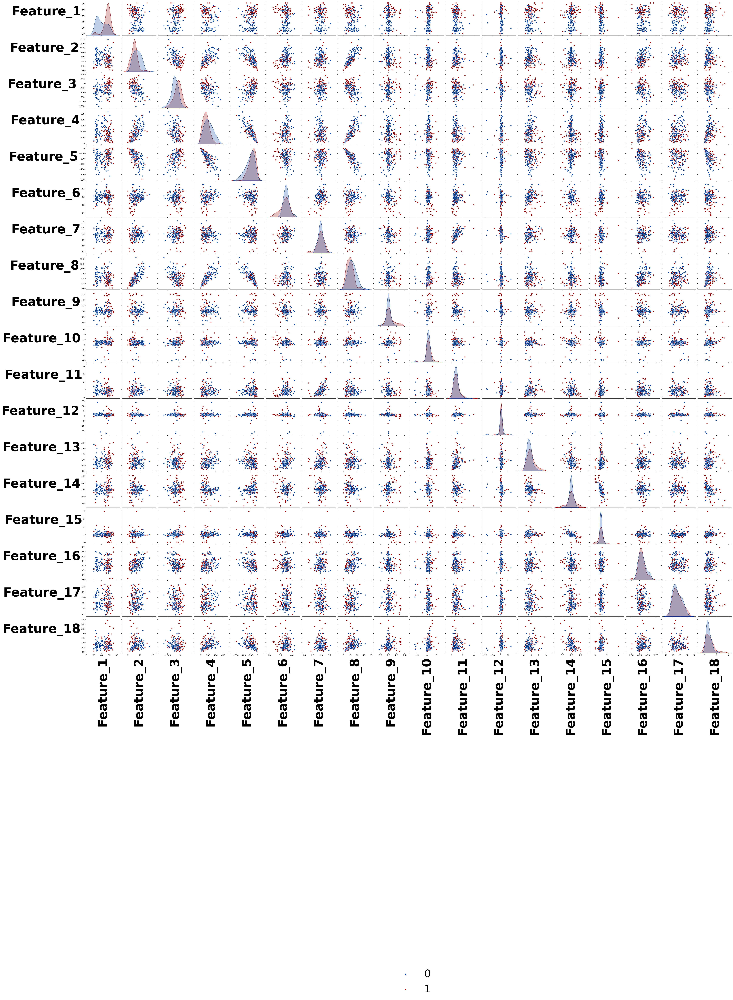

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt
font = {#'family': 'serif',
        'weight': 'bold',
        'size': 60
        }



#sns.set_theme(style="ticks")
g = sns.pairplot(new_df, hue="SubjectTypeClass",palette=["#003D96","#960000"])
#plt.rc('Legend', **font_legend)

for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(),fontdict=font,rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(),fontdict=font ,rotation = 0)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')

sns.move_legend(g, "lower center",bbox_to_anchor=(0.5,-0.5), ncol=1, title='Class',fontsize=50)
g._legend.set_title("")
plt.show()

In [ ]:
new_df_Control = new_df.query('SubjectTypeClass=="Control"')

In [ ]:
import seaborn as sns
sns.set_theme(style="white")
g = sns.PairGrid(new_df_Control, diag_sharey=False)
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=2)


for ax in g.axes.flatten():
    # rotate x axis labels

    ax.set_xlabel(ax.get_xlabel(),fontdict=font,rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(),fontdict=font ,rotation = 0)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')


In [ ]:
new_df_Tinnitus = new_df.query('SubjectTypeClass=="Tinnitus"')

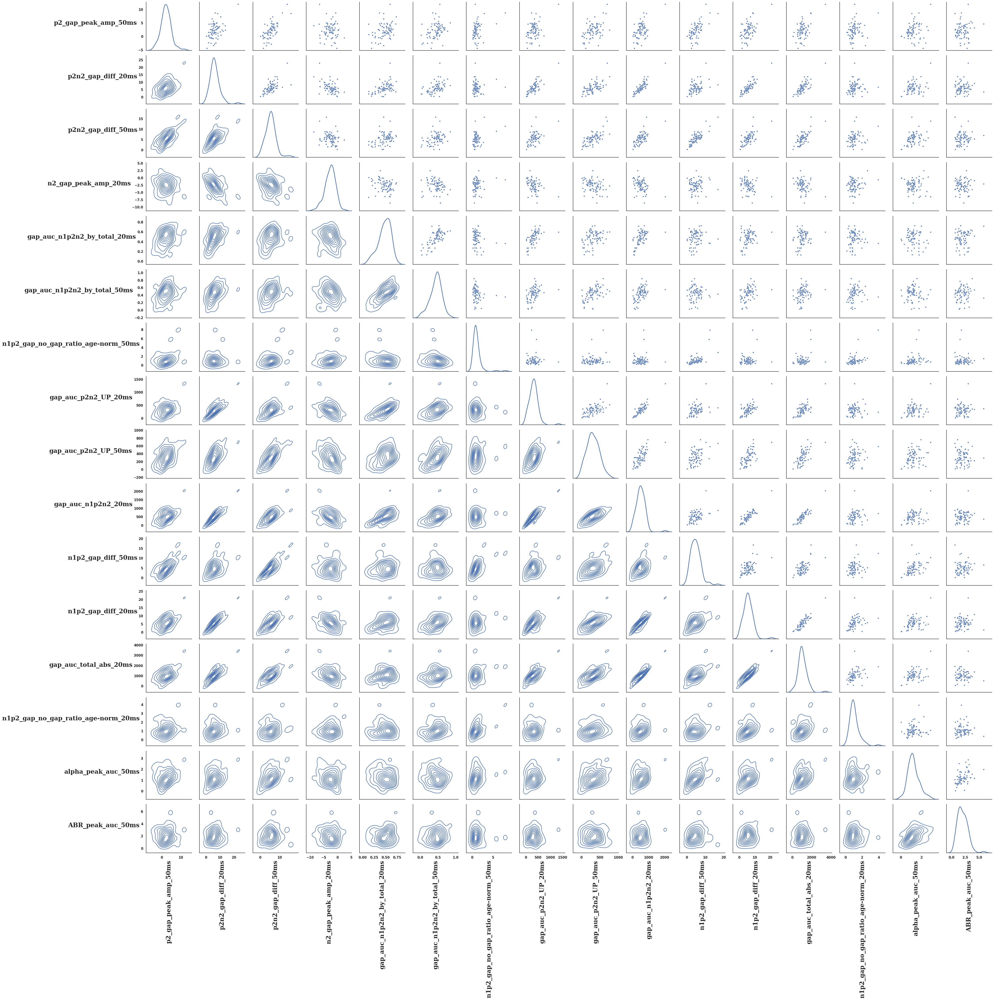

In [ ]:
import seaborn as sns
sns.set_theme(style="white")
g = sns.PairGrid(new_df_Tinnitus, diag_sharey=False,palette=["#960000"])
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=2)


for ax in g.axes.flatten():
    # rotate x axis labels

    ax.set_xlabel(ax.get_xlabel(),fontdict=font,rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(),fontdict=font ,rotation = 0)
    # set y labels alignment
    ax.yaxis.get_label().set_horizontalalignment('right')

## Data Partition

In [ ]:

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_new, y_new, test_size = 0.18, random_state = 0)

In [ ]:
'''
X_train=X_new.iloc[:134,:]
X_test=X_new.iloc[134:,:]
y_train=y_new.iloc[:134]
y_test=y_new.iloc[134:]
'''

'\nX_train=X_new.iloc[:134,:]\nX_test=X_new.iloc[134:,:]\ny_train=y_new.iloc[:134]\ny_test=y_new.iloc[134:]\n'

In [ ]:
X_train

,p2n2_diff_gap_50ms,auc_total_gap_50ms,n1p2_L_auc_gap_50ms,n1p2n2_auc_gap_20ms,n1p2_R_auc_gap_50ms,auc_total_gap_20ms,n1p2_L_auc_gap_20ms
33,7.073634,-505.732278,266.497590,639.629605,-206.616608,-483.373834,331.039833
55,4.101451,-196.223795,43.654170,356.615174,-76.838188,-432.271798,185.538125
66,5.928560,-16.285135,64.735447,528.115024,-70.895285,-775.777454,140.664132
83,6.843491,-331.996937,154.440601,296.638479,-88.937038,-793.674149,47.631579
24,8.593702,-278.016666,216.939075,473.881261,-182.310453,-297.198427,182.881938
...,...,...,...,...,...,...,...
9,5.937675,43.287236,363.356135,618.013815,-284.196952,69.706737,202.333855
103,3.231328,-245.047141,218.364952,283.058373,-175.104268,-149.265655,72.978996
67,5.783785,-992.295579,159.495360,331.546958,-155.831725,-561.523509,101.538612
117,9.233869,-324.986264,61.904697,870.548343,-90.841472,-457.017114,248.792072


In [ ]:
X_test

,p2n2_diff_gap_50ms,auc_total_gap_50ms,n1p2_L_auc_gap_50ms,n1p2n2_auc_gap_20ms,n1p2_R_auc_gap_50ms,auc_total_gap_20ms,n1p2_L_auc_gap_20ms
45,5.865072,-247.372991,115.685939,537.579939,-93.139021,-39.325060,220.328667
51,6.065540,-124.590683,223.649125,262.157728,-196.311915,-247.740028,187.876064
108,2.572781,-138.938129,68.777535,412.443321,-73.921291,146.441353,282.764129
7,5.243989,28.531520,381.629045,129.302932,-217.335090,-341.729331,129.302932
73,4.182791,-4.520805,120.151785,751.925668,-62.327375,-103.389081,366.580884
62,3.801891,-174.696966,65.922122,458.046819,-110.859011,-158.025687,213.161197
5,13.839559,-957.628103,208.174124,552.641510,-318.541063,-1024.714837,223.519379
56,4.082925,103.505369,157.501668,70.533732,-153.883828,-213.882506,207.652329
137,12.250938,-791.915252,243.206292,893.362158,-244.943364,-608.993425,337.973589
163,5.906800,235.518609,129.668018,455.411368,-113.300617,-178.836704,129.463678


###ANOVA with f classifciation

In [ ]:


from sklearn.datasets import make_classification
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
import pandas as pd



fs = SelectKBest(score_func=f_classif, k=5)
fit = fs.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

featureScores = pd.concat([dfcolumns,dfscores],axis=1)

featureScores.columns = ['Best_columns','Score_ANOVA']

lyst = featureScores.nlargest(number_of_feat,'Score_ANOVA')

#lyst.to_csv('Filter_Method_ANOVA_with_f_classif.csv')

list_of_feat = list(lyst["Best_columns"])
selection_method = "ANOVA"

#ADABOOST

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

ada_defult = AdaBoostClassifier(random_state=0)
ada_defult.fit(X_train, y_train)
y_pred = ada_defult.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(ada_defult,1,'AdaBoostClassifier')]=accuracy_score(y_test, y_pred)


[[ 9  7]
 [ 3 11]]
              precision    recall  f1-score   support

           0       0.75      0.56      0.64        16
           1       0.61      0.79      0.69        14

    accuracy                           0.67        30
   macro avg       0.68      0.67      0.67        30
weighted avg       0.69      0.67      0.66        30

Accurecy:  0.6666666666666666


1/200 round completed......................... Accurecy: 0.7
2/200 round completed......................... Accurecy: 0.7666666666666667
3/200 round completed......................... Accurecy: 0.7666666666666667
4/200 round completed......................... Accurecy: 0.7666666666666667
5/200 round completed......................... Accurecy: 0.7333333333333333
6/200 round completed......................... Accurecy: 0.7
7/200 round completed......................... Accurecy: 0.7
8/200 round completed......................... Accurecy: 0.6666666666666666
9/200 round completed......................... Accurecy: 0.7
10/200 round completed......................... Accurecy: 0.7
11/200 round completed......................... Accurecy: 0.6333333333333333
12/200 round completed......................... Accurecy: 0.6333333333333333
13/200 round completed......................... Accurecy: 0.6333333333333333
14/200 round completed......................... Accurecy: 0.6333333333333333
15/200

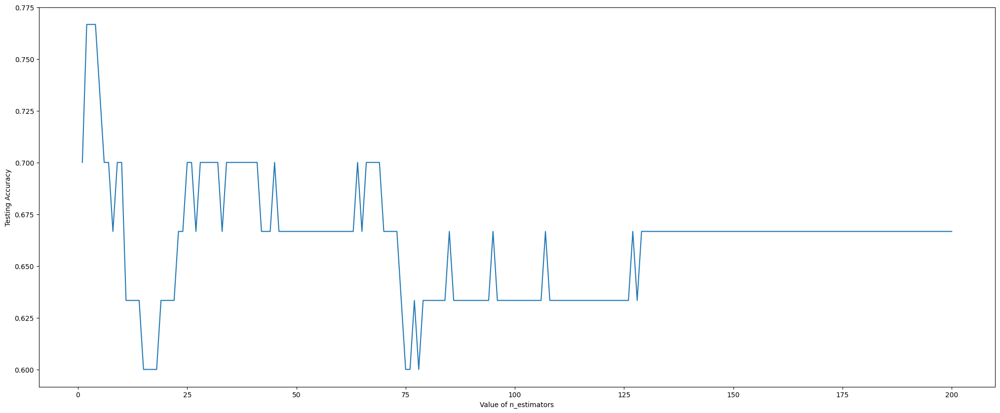

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
N=200
k_range = range (1,N+1)
scores={}
scores_list = []
for k in k_range:
  classifier = AdaBoostClassifier(n_estimators=k,random_state=0)
  classifier.fit(X_train, y_train)
  y_pred=classifier.predict(X_test)
  scores[k] = accuracy_score(y_test,y_pred)
  scores_list.append(accuracy_score(y_test,y_pred))
  print(str(k)+"/"+str(N)+" round completed......................... Accurecy: "+str(accuracy_score(y_test,y_pred)))



%matplotlib inline
import matplotlib.pyplot as plt
#plot the relationship between K and the testing accuracy
plt.figure(figsize = (25,10))
plt.plot(k_range,scores_list)
plt.xlabel('Value of n_estimators')
plt.ylabel ('Testing Accuracy')



print("The best n_estimators:")
best_estimator=list(scores.keys())[scores_list.index(max(scores_list))]
print(best_estimator)

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

ada_best_estimator = AdaBoostClassifier(n_estimators=best_estimator,random_state=0)
ada_best_estimator.fit(X_train, y_train)
y_pred = ada_best_estimator.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(ada_best_estimator,1,'AdaBoostClassifier')]=accuracy_score(y_test, y_pred)

[[10  6]
 [ 1 13]]
              precision    recall  f1-score   support

           0       0.91      0.62      0.74        16
           1       0.68      0.93      0.79        14

    accuracy                           0.77        30
   macro avg       0.80      0.78      0.76        30
weighted avg       0.80      0.77      0.76        30

Accurecy:  0.7666666666666667




---



---



#Graddient Boosting

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RepeatedStratifiedKFold

gradBoost_default = GradientBoostingClassifier(random_state=0)
gradBoost_default.fit(X_train, y_train)
y_pred = gradBoost_default.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(gradBoost_default,2,'GradientBoostingClassifier')]=accuracy_score(y_test, y_pred)

[[ 9  7]
 [ 3 11]]
              precision    recall  f1-score   support

           0       0.75      0.56      0.64        16
           1       0.61      0.79      0.69        14

    accuracy                           0.67        30
   macro avg       0.68      0.67      0.67        30
weighted avg       0.69      0.67      0.66        30

Accurecy:  0.6666666666666666


1/150 round completed......................... Accurecy: 0.6
2/150 round completed......................... Accurecy: 0.5666666666666667
3/150 round completed......................... Accurecy: 0.6
4/150 round completed......................... Accurecy: 0.5333333333333333
5/150 round completed......................... Accurecy: 0.5333333333333333
6/150 round completed......................... Accurecy: 0.5333333333333333
7/150 round completed......................... Accurecy: 0.5333333333333333
8/150 round completed......................... Accurecy: 0.5
9/150 round completed......................... Accurecy: 0.5333333333333333
10/150 round completed......................... Accurecy: 0.5
11/150 round completed......................... Accurecy: 0.5
12/150 round completed......................... Accurecy: 0.5
13/150 round completed......................... Accurecy: 0.5
14/150 round completed......................... Accurecy: 0.5
15/150 round completed......................... Acc

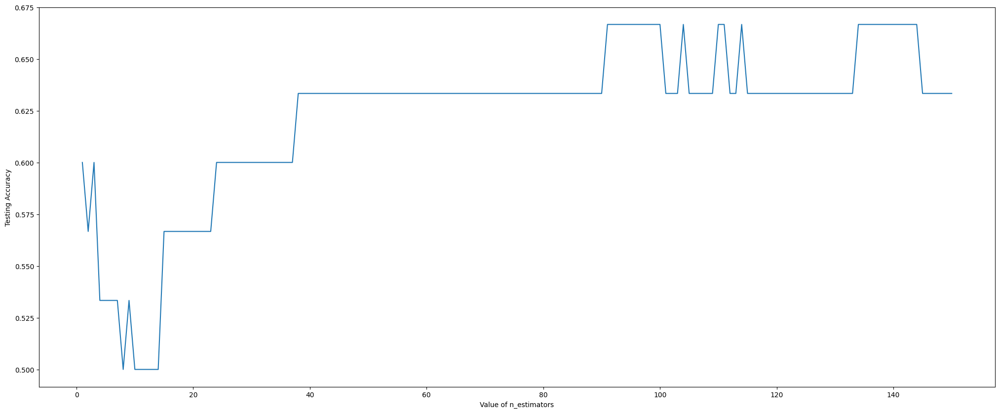

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
N=150
k_range = range (1,N+1)
scores={}
scores_list = []
for k in k_range:
  classifier = GradientBoostingClassifier(n_estimators=k,random_state=0)
  classifier.fit(X_train, y_train)
  y_pred=classifier.predict(X_test)
  scores[k] = accuracy_score(y_test,y_pred)
  scores_list.append(accuracy_score(y_test,y_pred))
  print(str(k)+"/"+str(N)+" round completed......................... Accurecy: "+str(accuracy_score(y_test,y_pred)))



%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize = (25,10))
plt.plot(k_range,scores_list)
plt.xlabel('Value of n_estimators')
plt.ylabel ('Testing Accuracy')



print("The best n_estimators:")
best_estimator=list(scores.keys())[scores_list.index(max(scores_list))]
print(best_estimator)

1/30 round completed......................... Accurecy: 0.7
2/30 round completed......................... Accurecy: 0.6666666666666666
3/30 round completed......................... Accurecy: 0.6666666666666666
4/30 round completed......................... Accurecy: 0.6333333333333333
5/30 round completed......................... Accurecy: 0.5666666666666667
6/30 round completed......................... Accurecy: 0.6333333333333333
7/30 round completed......................... Accurecy: 0.5333333333333333
8/30 round completed......................... Accurecy: 0.5666666666666667
9/30 round completed......................... Accurecy: 0.6
10/30 round completed......................... Accurecy: 0.5666666666666667
11/30 round completed......................... Accurecy: 0.5666666666666667
12/30 round completed......................... Accurecy: 0.5666666666666667
13/30 round completed......................... Accurecy: 0.5666666666666667
14/30 round completed......................... Accu

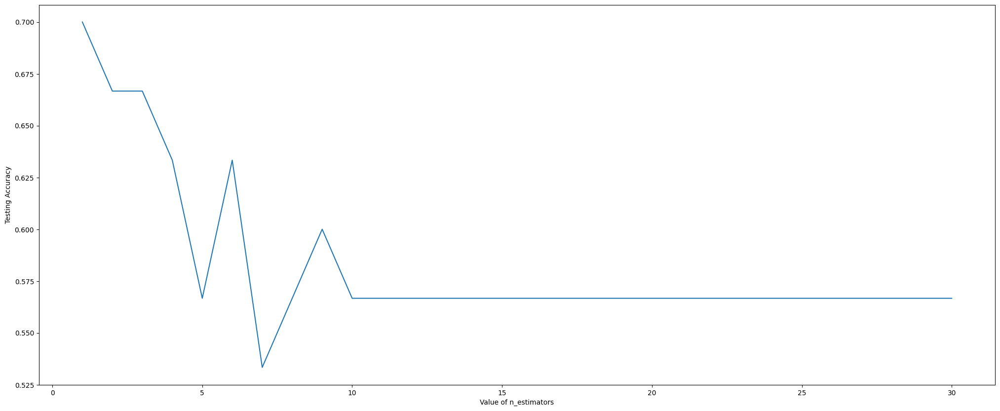

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
N=30
k_range = range (1,N+1)
scores={}
scores_list = []
for k in k_range:
  classifier = GradientBoostingClassifier(max_depth=k,random_state=0)
  classifier.fit(X_train, y_train)
  y_pred=classifier.predict(X_test)
  scores[k] = accuracy_score(y_test,y_pred)
  scores_list.append(accuracy_score(y_test,y_pred))
  print(str(k)+"/"+str(N)+" round completed......................... Accurecy: "+str(accuracy_score(y_test,y_pred)))



%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize = (25,10))
plt.plot(k_range,scores_list)
plt.xlabel('Value of n_estimators')
plt.ylabel ('Testing Accuracy')



print("The best Depth:")
best_depth=list(scores.keys())[scores_list.index(max(scores_list))]
print(best_depth)

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

gradBoost_estimator = GradientBoostingClassifier(n_estimators=best_estimator,random_state=0)
gradBoost_estimator.fit(X_train, y_train)
y_pred = gradBoost_estimator.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(gradBoost_estimator,2,'GradientBoostingClassifier')]=accuracy_score(y_test, y_pred)

[[ 9  7]
 [ 3 11]]
              precision    recall  f1-score   support

           0       0.75      0.56      0.64        16
           1       0.61      0.79      0.69        14

    accuracy                           0.67        30
   macro avg       0.68      0.67      0.67        30
weighted avg       0.69      0.67      0.66        30

Accurecy:  0.6666666666666666


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

gradBoost_depth = GradientBoostingClassifier(max_depth=best_depth,random_state=0)
gradBoost_depth.fit(X_train, y_train)
y_pred = gradBoost_depth.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))

result[(gradBoost_depth,2,'GradientBoostingClassifier')]=accuracy_score(y_test, y_pred)

[[ 8  8]
 [ 1 13]]
              precision    recall  f1-score   support

           0       0.89      0.50      0.64        16
           1       0.62      0.93      0.74        14

    accuracy                           0.70        30
   macro avg       0.75      0.71      0.69        30
weighted avg       0.76      0.70      0.69        30

Accurecy:  0.7


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

gradBoost_all = GradientBoostingClassifier(n_estimators=best_estimator,max_depth=best_depth,random_state=0)
gradBoost_all.fit(X_train, y_train)
y_pred = gradBoost_all.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))

result[(gradBoost_all,2,'GradientBoostingClassifier')]=accuracy_score(y_test, y_pred)

[[ 8  8]
 [ 1 13]]
              precision    recall  f1-score   support

           0       0.89      0.50      0.64        16
           1       0.62      0.93      0.74        14

    accuracy                           0.70        30
   macro avg       0.75      0.71      0.69        30
weighted avg       0.76      0.70      0.69        30

Accurecy:  0.7




---



---



#Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf_default = RandomForestClassifier(random_state=0)
rf_default.fit(X_train, y_train)
y_pred=rf_default.predict(X_test)


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(rf_default,3,'RandomForestClassifier')]=accuracy_score(y_test, y_pred)

[[ 9  7]
 [ 3 11]]
              precision    recall  f1-score   support

           0       0.75      0.56      0.64        16
           1       0.61      0.79      0.69        14

    accuracy                           0.67        30
   macro avg       0.68      0.67      0.67        30
weighted avg       0.69      0.67      0.66        30

Accurecy:  0.6666666666666666


1/150 round completed......................... Accurecy: 0.7
2/150 round completed......................... Accurecy: 0.7
3/150 round completed......................... Accurecy: 0.6333333333333333
4/150 round completed......................... Accurecy: 0.6666666666666666
5/150 round completed......................... Accurecy: 0.6333333333333333
6/150 round completed......................... Accurecy: 0.6666666666666666
7/150 round completed......................... Accurecy: 0.6
8/150 round completed......................... Accurecy: 0.6333333333333333
9/150 round completed......................... Accurecy: 0.6333333333333333
10/150 round completed......................... Accurecy: 0.6
11/150 round completed......................... Accurecy: 0.5666666666666667
12/150 round completed......................... Accurecy: 0.6333333333333333
13/150 round completed......................... Accurecy: 0.6333333333333333
14/150 round completed......................... Accurecy: 0.63333333

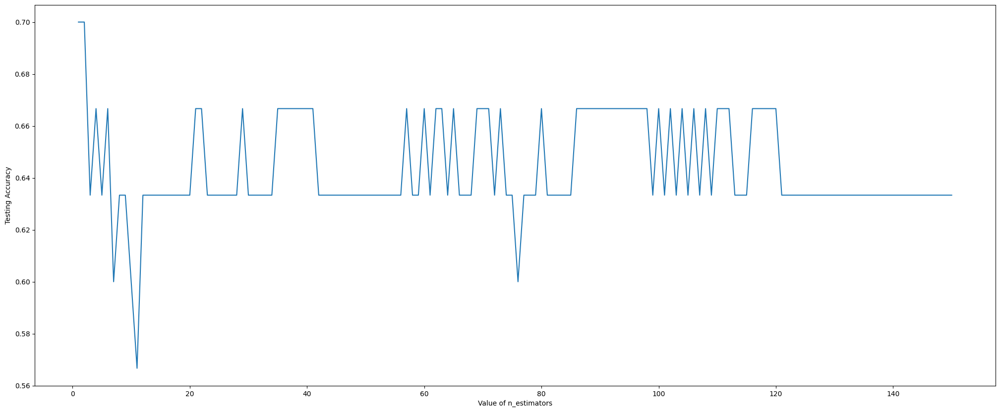

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
N=150
k_range = range (1,N+1)
scores={}
scores_list = []
for k in k_range:
  classifier = RandomForestClassifier(n_estimators=k,random_state=0)
  classifier.fit(X_train, y_train)
  y_pred=classifier.predict(X_test)
  scores[k] = accuracy_score(y_test,y_pred)
  scores_list.append(accuracy_score(y_test,y_pred))
  print(str(k)+"/"+str(N)+" round completed......................... Accurecy: "+str(accuracy_score(y_test,y_pred)))



%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize = (25,10))
plt.plot(k_range,scores_list)
plt.xlabel('Value of n_estimators')
plt.ylabel ('Testing Accuracy')



print("The best n_estimators:")
best_estimator=list(scores.keys())[scores_list.index(max(scores_list))]
print(best_estimator)

1/150 round completed......................... Accurecy: 0.7
2/150 round completed......................... Accurecy: 0.7333333333333333
3/150 round completed......................... Accurecy: 0.7333333333333333
4/150 round completed......................... Accurecy: 0.6666666666666666
5/150 round completed......................... Accurecy: 0.6666666666666666
6/150 round completed......................... Accurecy: 0.7
7/150 round completed......................... Accurecy: 0.6666666666666666
8/150 round completed......................... Accurecy: 0.7333333333333333
9/150 round completed......................... Accurecy: 0.6666666666666666
10/150 round completed......................... Accurecy: 0.6666666666666666
11/150 round completed......................... Accurecy: 0.6666666666666666
12/150 round completed......................... Accurecy: 0.6666666666666666
13/150 round completed......................... Accurecy: 0.6666666666666666
14/150 round completed................

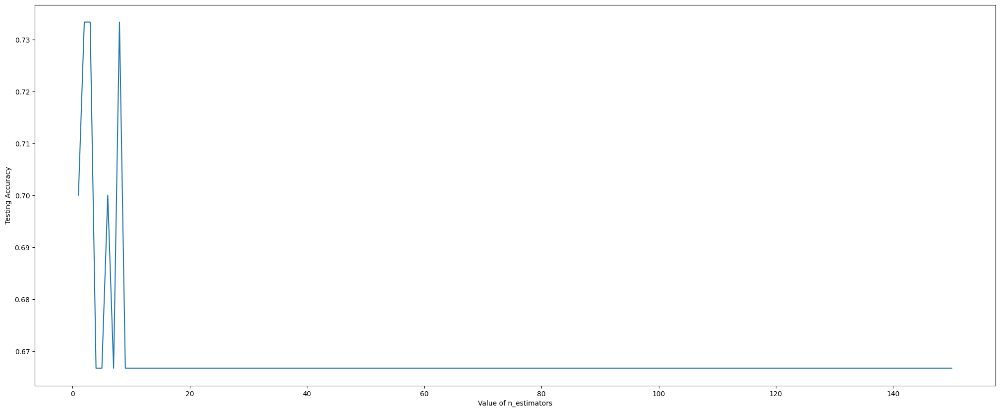

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
N=150
k_range = range (1,N+1)
scores={}
scores_list = []
for k in k_range:
  classifier = RandomForestClassifier(max_depth=k,random_state=0)
  classifier.fit(X_train, y_train)
  y_pred=classifier.predict(X_test)
  scores[k] = accuracy_score(y_test,y_pred)
  scores_list.append(accuracy_score(y_test,y_pred))
  print(str(k)+"/"+str(N)+" round completed......................... Accurecy: "+str(accuracy_score(y_test,y_pred)))



%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize = (25,10))
plt.plot(k_range,scores_list)
plt.xlabel('Value of n_estimators')
plt.ylabel ('Testing Accuracy')



print("The best Depth:")
best_depth=list(scores.keys())[scores_list.index(max(scores_list))]
print(best_depth)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf_estimator = RandomForestClassifier(n_estimators=best_estimator,random_state=0)
rf_estimator.fit(X_train, y_train)
y_pred=rf_estimator.predict(X_test)


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(rf_estimator,3,'RandomForestClassifier')]=accuracy_score(y_test, y_pred)

[[11  5]
 [ 4 10]]
              precision    recall  f1-score   support

           0       0.73      0.69      0.71        16
           1       0.67      0.71      0.69        14

    accuracy                           0.70        30
   macro avg       0.70      0.70      0.70        30
weighted avg       0.70      0.70      0.70        30

Accurecy:  0.7


In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf_depth = RandomForestClassifier(max_depth=best_depth,random_state=0)
rf_depth.fit(X_train, y_train)
y_pred=rf_depth.predict(X_test)


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(rf_depth,3,'RandomForestClassifier')]=accuracy_score(y_test, y_pred)

[[ 9  7]
 [ 1 13]]
              precision    recall  f1-score   support

           0       0.90      0.56      0.69        16
           1       0.65      0.93      0.76        14

    accuracy                           0.73        30
   macro avg       0.78      0.75      0.73        30
weighted avg       0.78      0.73      0.73        30

Accurecy:  0.7333333333333333


In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf_all = RandomForestClassifier(n_estimators=best_estimator,max_depth=best_depth,random_state=0)
rf_all.fit(X_train, y_train)
y_pred=rf_all.predict(X_test)


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(rf_all,3,'RandomForestClassifier')]=accuracy_score(y_test, y_pred)

[[ 5 11]
 [ 3 11]]
              precision    recall  f1-score   support

           0       0.62      0.31      0.42        16
           1       0.50      0.79      0.61        14

    accuracy                           0.53        30
   macro avg       0.56      0.55      0.51        30
weighted avg       0.57      0.53      0.51        30

Accurecy:  0.5333333333333333




---



---



#XGB

In [ ]:
import xgboost as xgb
xgb_deafult = xgb.XGBClassifier(random_state=0)
xgb_deafult.fit(X_train,y_train)
y_pred = xgb_deafult.predict(X_test)


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(xgb_deafult,4,'xgboost')]=accuracy_score(y_test, y_pred)

[[ 9  7]
 [ 3 11]]
              precision    recall  f1-score   support

           0       0.75      0.56      0.64        16
           1       0.61      0.79      0.69        14

    accuracy                           0.67        30
   macro avg       0.68      0.67      0.67        30
weighted avg       0.69      0.67      0.66        30

Accurecy:  0.6666666666666666


1/250 round completed......................... Accurecy: 0.7
2/250 round completed......................... Accurecy: 0.7333333333333333
3/250 round completed......................... Accurecy: 0.6666666666666666
4/250 round completed......................... Accurecy: 0.6666666666666666
5/250 round completed......................... Accurecy: 0.6666666666666666
6/250 round completed......................... Accurecy: 0.6666666666666666
7/250 round completed......................... Accurecy: 0.6333333333333333
8/250 round completed......................... Accurecy: 0.6333333333333333
9/250 round completed......................... Accurecy: 0.6333333333333333
10/250 round completed......................... Accurecy: 0.6333333333333333
11/250 round completed......................... Accurecy: 0.6666666666666666
12/250 round completed......................... Accurecy: 0.6666666666666666
13/250 round completed......................... Accurecy: 0.6666666666666666
14/250 round completed.

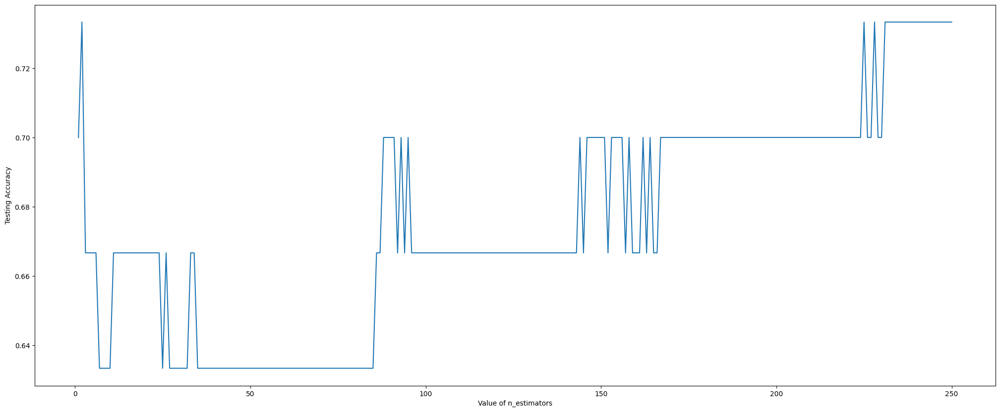

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score
N=250
k_range = range (1,N+1)
scores={}
scores_list = []
for k in k_range:
  xgb_classifier = xgb.XGBClassifier(n_estimators=k,random_state=0)
  xgb_classifier.fit(X_train, y_train)
  y_pred=xgb_classifier.predict(X_test)
  scores[k] = accuracy_score(y_test,y_pred)
  scores_list.append(accuracy_score(y_test,y_pred))
  print(str(k)+"/"+str(N)+" round completed......................... Accurecy: "+str(accuracy_score(y_test,y_pred)))


%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize = (25,10))
plt.plot(k_range,scores_list)
plt.xlabel('Value of n_estimators')
plt.ylabel ('Testing Accuracy')



print("The best n_estimators:")
best_estimator=list(scores.keys())[scores_list.index(max(scores_list))]
print(best_estimator)

1/250 round completed......................... Accurecy: 0.6666666666666666
2/250 round completed......................... Accurecy: 0.6666666666666666
3/250 round completed......................... Accurecy: 0.7
4/250 round completed......................... Accurecy: 0.7
5/250 round completed......................... Accurecy: 0.6666666666666666
6/250 round completed......................... Accurecy: 0.6666666666666666
7/250 round completed......................... Accurecy: 0.7
8/250 round completed......................... Accurecy: 0.6333333333333333
9/250 round completed......................... Accurecy: 0.6666666666666666
10/250 round completed......................... Accurecy: 0.6666666666666666
11/250 round completed......................... Accurecy: 0.6666666666666666
12/250 round completed......................... Accurecy: 0.6666666666666666
13/250 round completed......................... Accurecy: 0.6666666666666666
14/250 round completed......................... Accur

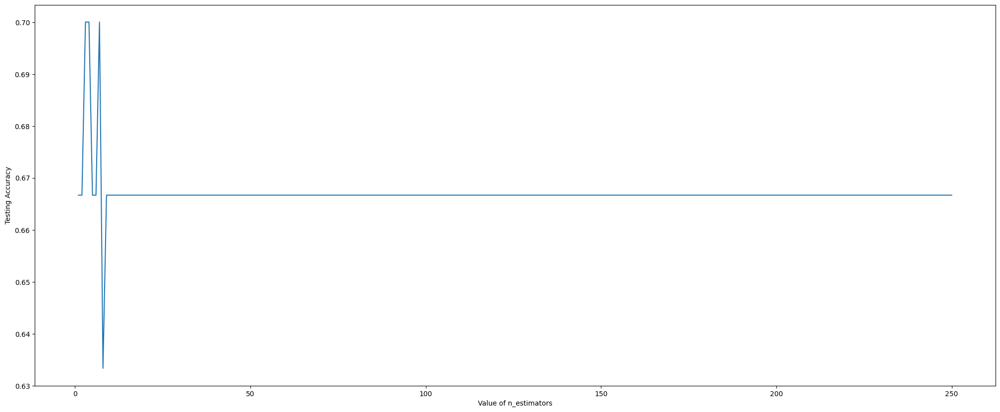

In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score
N=250
k_range = range (1,N+1)
scores={}
scores_list = []
for k in k_range:
  xgb_classifier = xgb.XGBClassifier(max_depth=k,random_state=0)
  xgb_classifier.fit(X_train, y_train)
  y_pred=xgb_classifier.predict(X_test)
  scores[k] = accuracy_score(y_test,y_pred)
  scores_list.append(accuracy_score(y_test,y_pred))
  print(str(k)+"/"+str(N)+" round completed......................... Accurecy: "+str(accuracy_score(y_test,y_pred)))


%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize = (25,10))
plt.plot(k_range,scores_list)
plt.xlabel('Value of n_estimators')
plt.ylabel ('Testing Accuracy')



print("The best depth:")
best_depth=list(scores.keys())[scores_list.index(max(scores_list))]
print(best_depth)

In [ ]:
import xgboost as xgb
xgb_depth = xgb.XGBClassifier(max_depth=best_depth,random_state=0)
xgb_depth.fit(X_train,y_train)
y_pred = xgb_depth.predict(X_test)


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(xgb_depth,4,'xgboost')]=accuracy_score(y_test, y_pred)
print(xgb_depth)

[[10  6]
 [ 3 11]]
              precision    recall  f1-score   support

           0       0.77      0.62      0.69        16
           1       0.65      0.79      0.71        14

    accuracy                           0.70        30
   macro avg       0.71      0.71      0.70        30
weighted avg       0.71      0.70      0.70        30

Accurecy:  0.7
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
             

In [ ]:
import xgboost as xgb
xgb_estimator = xgb.XGBClassifier(n_estimators=best_estimator,random_state=0)
xgb_estimator.fit(X_train,y_train)
y_pred = xgb_estimator.predict(X_test)


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(xgb_estimator,4,'xgboost')]=accuracy_score(y_test, y_pred)
print(xgb_estimator)

[[10  6]
 [ 2 12]]
              precision    recall  f1-score   support

           0       0.83      0.62      0.71        16
           1       0.67      0.86      0.75        14

    accuracy                           0.73        30
   macro avg       0.75      0.74      0.73        30
weighted avg       0.76      0.73      0.73        30

Accurecy:  0.7333333333333333
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=N

In [ ]:
import xgboost as xgb
xgb_all = xgb.XGBClassifier(n_estimators=best_estimator,max_depth=best_depth,random_state=0)
xgb_all.fit(X_train,y_train)
y_pred = xgb_all.predict(X_test)


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(xgb_all,4,'xgboost')]=accuracy_score(y_test, y_pred)

[[12  4]
 [ 4 10]]
              precision    recall  f1-score   support

           0       0.75      0.75      0.75        16
           1       0.71      0.71      0.71        14

    accuracy                           0.73        30
   macro avg       0.73      0.73      0.73        30
weighted avg       0.73      0.73      0.73        30

Accurecy:  0.7333333333333333


#KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_default = KNeighborsClassifier()
knn_default.fit(X_train, y_train)
y_pred=knn_default.predict(X_test)


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(knn_default,5,'KNeighborsClassifier')]=accuracy_score(y_test, y_pred)

[[ 6 10]
 [ 3 11]]
              precision    recall  f1-score   support

           0       0.67      0.38      0.48        16
           1       0.52      0.79      0.63        14

    accuracy                           0.57        30
   macro avg       0.60      0.58      0.55        30
weighted avg       0.60      0.57      0.55        30

Accurecy:  0.5666666666666667


1/105 round completed......................... Accurecy: 0.6333333333333333
2/105 round completed......................... Accurecy: 0.7666666666666667
3/105 round completed......................... Accurecy: 0.5666666666666667
4/105 round completed......................... Accurecy: 0.6
5/105 round completed......................... Accurecy: 0.5666666666666667
6/105 round completed......................... Accurecy: 0.6
7/105 round completed......................... Accurecy: 0.5666666666666667
8/105 round completed......................... Accurecy: 0.6333333333333333
9/105 round completed......................... Accurecy: 0.5666666666666667
10/105 round completed......................... Accurecy: 0.6666666666666666
11/105 round completed......................... Accurecy: 0.6666666666666666
12/105 round completed......................... Accurecy: 0.6666666666666666
13/105 round completed......................... Accurecy: 0.6666666666666666
14/105 round completed................

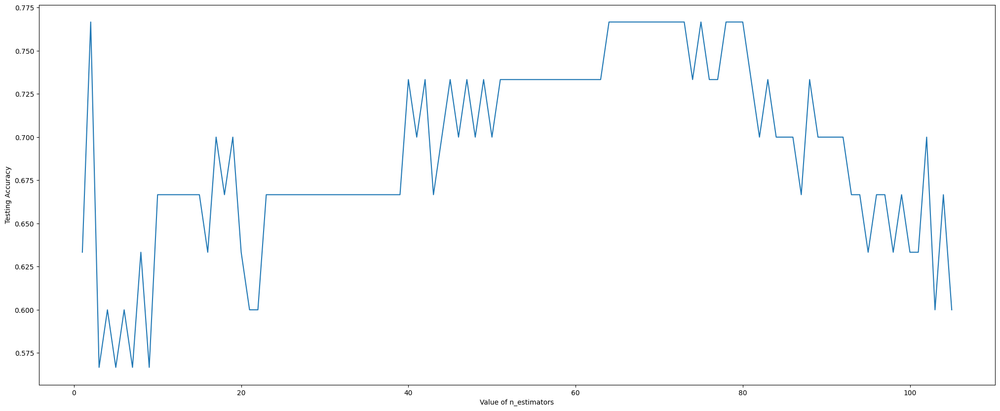

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
Neighbors=105
k_range = range (1,Neighbors+1)
scores={}
scores_list = []
for k in k_range:
  knn = KNeighborsClassifier(n_neighbors=k)
  knn.fit(X_train, y_train)
  y_pred=knn.predict(X_test)
  scores[k] = accuracy_score(y_test,y_pred)
  scores_list.append(accuracy_score(y_test,y_pred))
  print(str(k)+"/"+str(Neighbors)+" round completed......................... Accurecy: "+str(accuracy_score(y_test,y_pred)))


%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize = (25,10))
plt.plot(k_range,scores_list)
plt.xlabel('Value of n_estimators')
plt.ylabel ('Testing Accuracy')



print("The best Depth:")
best=list(scores.keys())[scores_list.index(max(scores_list))]
print(best)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn_neighbors = KNeighborsClassifier(n_neighbors=best)
knn_neighbors.fit(X_train, y_train)
y_pred=knn_neighbors.predict(X_test)


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(knn_neighbors,5,'KNeighborsClassifier')]=accuracy_score(y_test, y_pred)

[[14  2]
 [ 5  9]]
              precision    recall  f1-score   support

           0       0.74      0.88      0.80        16
           1       0.82      0.64      0.72        14

    accuracy                           0.77        30
   macro avg       0.78      0.76      0.76        30
weighted avg       0.77      0.77      0.76        30

Accurecy:  0.7666666666666667


#NB

In [ ]:
from sklearn.naive_bayes import GaussianNB

nb_deafult = GaussianNB()
nb_deafult.fit(X_train, y_train)
y_pred = nb_deafult.predict(X_test)


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(nb_deafult,6,'GaussianNB')]=accuracy_score(y_test, y_pred)

[[ 6 10]
 [ 1 13]]
              precision    recall  f1-score   support

           0       0.86      0.38      0.52        16
           1       0.57      0.93      0.70        14

    accuracy                           0.63        30
   macro avg       0.71      0.65      0.61        30
weighted avg       0.72      0.63      0.61        30

Accurecy:  0.6333333333333333


#Histogram-Based Gradient Boosting

In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier

hisgradBoost_default = HistGradientBoostingClassifier(random_state=0)
hisgradBoost_default.fit(X_train, y_train)
y_pred = hisgradBoost_default.predict(X_test)


from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(hisgradBoost_default,7,'HistGradientBoostingClassifier')]=accuracy_score(y_test, y_pred)


[[ 8  8]
 [ 2 12]]
              precision    recall  f1-score   support

           0       0.80      0.50      0.62        16
           1       0.60      0.86      0.71        14

    accuracy                           0.67        30
   macro avg       0.70      0.68      0.66        30
weighted avg       0.71      0.67      0.66        30

Accurecy:  0.6666666666666666


100/1000 round completed......................... Accurecy: 0.6666666666666666
200/1000 round completed......................... Accurecy: 0.6666666666666666
300/1000 round completed......................... Accurecy: 0.6666666666666666
400/1000 round completed......................... Accurecy: 0.6666666666666666
500/1000 round completed......................... Accurecy: 0.6333333333333333
600/1000 round completed......................... Accurecy: 0.6333333333333333
700/1000 round completed......................... Accurecy: 0.6333333333333333
800/1000 round completed......................... Accurecy: 0.6333333333333333
900/1000 round completed......................... Accurecy: 0.6333333333333333
1000/1000 round completed......................... Accurecy: 0.6333333333333333
The best max_iter:
100


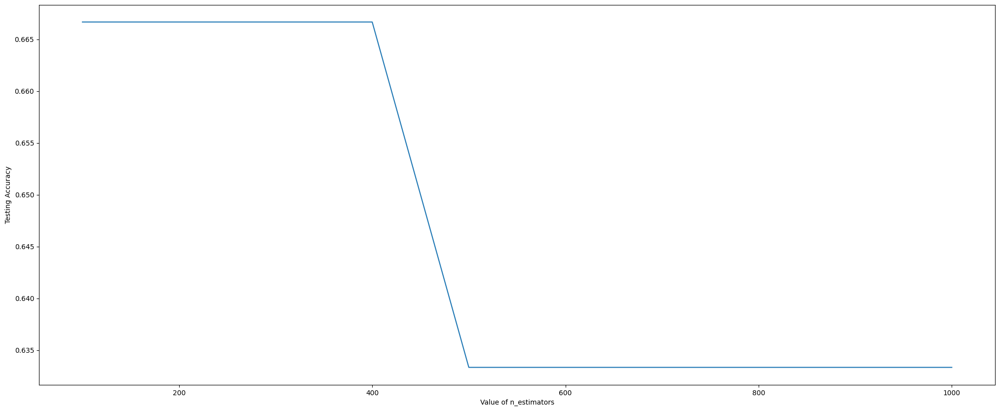

In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import accuracy_score
N=1000
k_range = range (100,N+1,100)
scores={}
scores_list = []
for k in k_range:
  hisgradBoost_cls = HistGradientBoostingClassifier(max_iter=k,random_state=0)
  hisgradBoost_cls.fit(X_train, y_train)
  y_pred=hisgradBoost_cls.predict(X_test)
  scores[k] = accuracy_score(y_test,y_pred)
  scores_list.append(accuracy_score(y_test,y_pred))
  print(str(k)+"/"+str(N)+" round completed......................... Accurecy: "+str(accuracy_score(y_test,y_pred)))


%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize = (25,10))
plt.plot(k_range,scores_list)
plt.xlabel('Value of n_estimators')
plt.ylabel ('Testing Accuracy')



print("The best max_iter:")
best_estimator=list(scores.keys())[scores_list.index(max(scores_list))]
print(best_estimator)

1/50 round completed......................... Accurecy: 0.7
2/50 round completed......................... Accurecy: 0.7
3/50 round completed......................... Accurecy: 0.7
4/50 round completed......................... Accurecy: 0.7
5/50 round completed......................... Accurecy: 0.6666666666666666
6/50 round completed......................... Accurecy: 0.6666666666666666
7/50 round completed......................... Accurecy: 0.6666666666666666
8/50 round completed......................... Accurecy: 0.6666666666666666
9/50 round completed......................... Accurecy: 0.6666666666666666
10/50 round completed......................... Accurecy: 0.6666666666666666
11/50 round completed......................... Accurecy: 0.6666666666666666
12/50 round completed......................... Accurecy: 0.6666666666666666
13/50 round completed......................... Accurecy: 0.6666666666666666
14/50 round completed......................... Accurecy: 0.6666666666666666
15/50

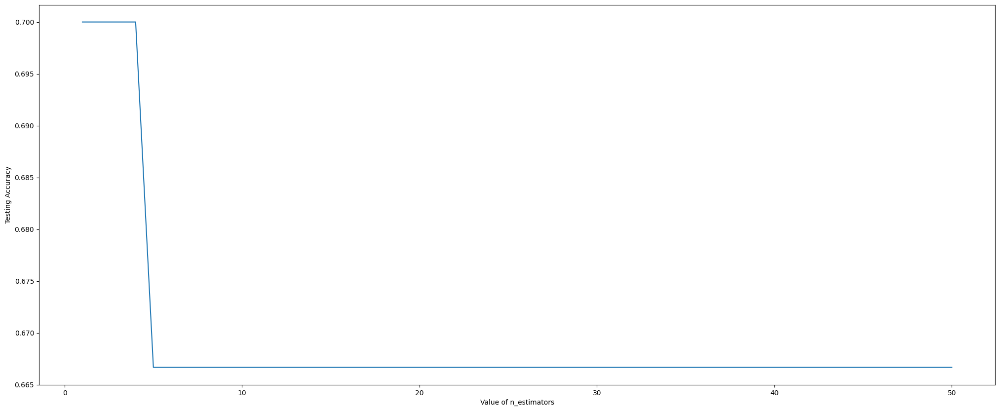

In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import accuracy_score
N=50
k_range = range (1,N+1)
scores={}
scores_list = []
for k in k_range:
  hisgradBoost_cls = HistGradientBoostingClassifier(max_depth=k,random_state=0)
  hisgradBoost_cls.fit(X_train, y_train)
  y_pred=hisgradBoost_cls.predict(X_test)
  scores[k] = accuracy_score(y_test,y_pred)
  scores_list.append(accuracy_score(y_test,y_pred))
  print(str(k)+"/"+str(N)+" round completed......................... Accurecy: "+str(accuracy_score(y_test,y_pred)))


%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize = (25,10))
plt.plot(k_range,scores_list)
plt.xlabel('Value of n_estimators')
plt.ylabel ('Testing Accuracy')



print("The best max_depth:")
max_depth=list(scores.keys())[scores_list.index(max(scores_list))]
print(max_depth)

In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import accuracy_score

hisgradBoost_max_iter = HistGradientBoostingClassifier(max_iter=best_estimator,random_state=0)
hisgradBoost_max_iter.fit(X_train, y_train)
y_pred = hisgradBoost_max_iter.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(hisgradBoost_max_iter,8,'HistGradientBoostingClassifier')]=accuracy_score(y_test, y_pred)

[[ 8  8]
 [ 2 12]]
              precision    recall  f1-score   support

           0       0.80      0.50      0.62        16
           1       0.60      0.86      0.71        14

    accuracy                           0.67        30
   macro avg       0.70      0.68      0.66        30
weighted avg       0.71      0.67      0.66        30

Accurecy:  0.6666666666666666


In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import accuracy_score

hisgradBoost_max_depth = HistGradientBoostingClassifier(max_depth=max_depth,random_state=0)
hisgradBoost_max_depth.fit(X_train, y_train)
y_pred = hisgradBoost_max_depth.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(hisgradBoost_max_depth,9,'HistGradientBoostingClassifier')]=accuracy_score(y_test, y_pred)

[[ 8  8]
 [ 1 13]]
              precision    recall  f1-score   support

           0       0.89      0.50      0.64        16
           1       0.62      0.93      0.74        14

    accuracy                           0.70        30
   macro avg       0.75      0.71      0.69        30
weighted avg       0.76      0.70      0.69        30

Accurecy:  0.7


In [ ]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import accuracy_score

hisgradBoost_all = HistGradientBoostingClassifier(max_iter=best_estimator,max_depth=max_depth,random_state=0)
hisgradBoost_all.fit(X_train, y_train)
y_pred = hisgradBoost_all.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test,y_pred))
print("Accurecy: ",accuracy_score(y_test, y_pred))
result[(hisgradBoost_all,10,'HistGradientBoostingClassifier')]=accuracy_score(y_test, y_pred)

[[ 8  8]
 [ 1 13]]
              precision    recall  f1-score   support

           0       0.89      0.50      0.64        16
           1       0.62      0.93      0.74        14

    accuracy                           0.70        30
   macro avg       0.75      0.71      0.69        30
weighted avg       0.76      0.70      0.69        30

Accurecy:  0.7


#Result

In [ ]:

models=[]

for i in result:
  models.append(i[0])
  print(i[0],i[1]," : ",result[i])
  print("---------------------------------------------------------------")
  print()

AdaBoostClassifier(random_state=0) 1  :  0.6666666666666666
---------------------------------------------------------------

AdaBoostClassifier(n_estimators=2, random_state=0) 1  :  0.7666666666666667
---------------------------------------------------------------

GradientBoostingClassifier(random_state=0) 2  :  0.6666666666666666
---------------------------------------------------------------

GradientBoostingClassifier(n_estimators=91, random_state=0) 2  :  0.6666666666666666
---------------------------------------------------------------

GradientBoostingClassifier(max_depth=1, random_state=0) 2  :  0.7
---------------------------------------------------------------

GradientBoostingClassifier(max_depth=1, n_estimators=91, random_state=0) 2  :  0.7
---------------------------------------------------------------

RandomForestClassifier(random_state=0) 3  :  0.6666666666666666
---------------------------------------------------------------

RandomForestClassifier(n_estimators=1, rand

In [ ]:
sorted_list=[]
sorted_list = sorted(result, key=result.get,reverse=True)

for i in sorted_list:
  print(i,"  : ",result[i])
  print("-------------------------------------------------------------------------------------------------")

print(sorted_list)


flage=[]
best_models=[]
it=0

for i in sorted_list:
  if it==4:
    break

  if i[1] not in flage:
    best_models.append((i[0],i[2]))
    flage.append(i[1])
    it+=1


(AdaBoostClassifier(n_estimators=2, random_state=0), 1, 'AdaBoostClassifier')   :  0.7666666666666667
-------------------------------------------------------------------------------------------------
(KNeighborsClassifier(n_neighbors=2), 5, 'KNeighborsClassifier')   :  0.7666666666666667
-------------------------------------------------------------------------------------------------
(RandomForestClassifier(max_depth=2, random_state=0), 3, 'RandomForestClassifier')   :  0.7333333333333333
-------------------------------------------------------------------------------------------------
(XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None,

In [ ]:
print("best_models:")
for i in best_models:
  print(i)


best_models:
(AdaBoostClassifier(n_estimators=2, random_state=0), 'AdaBoostClassifier')
(KNeighborsClassifier(n_neighbors=2), 'KNeighborsClassifier')
(RandomForestClassifier(max_depth=2, random_state=0), 'RandomForestClassifier')
(XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=2, n_jobs=None,
              num_parallel_tree=None, random_state=0, ...), 'xgboost')


In [ ]:
len(best_models)

4

#Testing Accuracy For Best 4 Models

In [ ]:

for i in best_models:
  print("--------------------------------------------------")
  print(i[0])
  y_pred=i[0].predict(X_test)
  print(confusion_matrix(y_test, y_pred))
  print(classification_report(y_test,y_pred))
  print("Accurecy: ",accuracy_score(y_test, y_pred))

--------------------------------------------------
AdaBoostClassifier(n_estimators=2, random_state=0)
[[10  6]
 [ 1 13]]
              precision    recall  f1-score   support

           0       0.91      0.62      0.74        16
           1       0.68      0.93      0.79        14

    accuracy                           0.77        30
   macro avg       0.80      0.78      0.76        30
weighted avg       0.80      0.77      0.76        30

Accurecy:  0.7666666666666667
--------------------------------------------------
KNeighborsClassifier(n_neighbors=2)
[[14  2]
 [ 5  9]]
              precision    recall  f1-score   support

           0       0.74      0.88      0.80        16
           1       0.82      0.64      0.72        14

    accuracy                           0.77        30
   macro avg       0.78      0.76      0.76        30
weighted avg       0.77      0.77      0.76        30

Accurecy:  0.7666666666666667
--------------------------------------------------
RandomFo

#SHAP

In [ ]:
!pip install shap
import shap
import matplotlib.pyplot as plt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 7.3 MB/s eta 0:00:00


In [ ]:

def SHAP_EXP(model,graph_feat):
  print("Models: ",model)

  explainer = shap.Explainer(model.predict, X_train)

  shap_values1 = explainer(X_train)
  features_names=final_list_feature

  if 'Subjects' in features_names:
    features_names.pop(0)

  print("Global Explaination")
  shap.plots.bar(shap_values1,max_display=30,show=False)

  plt.xlabel('Mean SHAP Value (Impact on Model Output)',fontweight="bold",fontsize=16)
  plt.ylabel('Features',fontweight="bold",fontsize=16)
  plt.xticks(fontsize=16, weight = 'bold')
  plt.yticks(fontsize=16, weight = 'bold')

  plt.show()
  print("Global Explaination")

  shap.summary_plot(shap_values1,max_display=30,show=False)
  plt.xlabel('Mean SHAP Value (Impact on Model Output)',fontweight="bold",fontsize=16)
  plt.ylabel('Features',fontweight="bold",fontsize=16)
  plt.xticks(fontsize=16, weight = 'bold')
  plt.yticks(fontsize=16, weight = 'bold')

  plt.show()
  print("__________________________")
  shap.plots.violin(shap_values1, feature_names=features_names, plot_type="layered_violin",max_display=30,show=False)
  plt.xlabel('Mean SHAP Value (Impact on Model Output)',fontweight="bold",fontsize=16)
  plt.ylabel('Features',fontweight="bold",fontsize=16)
  plt.xticks(fontsize=16, weight = 'bold')
  plt.yticks(fontsize=16, weight = 'bold')

  plt.show()
  print("Local Explaination")
  shap.plots.violin(shap_values1,feature_names=features_names, max_display=30,show=False)
  plt.xlabel('Mean SHAP Value (Impact on Model Output)',fontweight="bold",fontsize=13)
  plt.ylabel('Features',fontweight="bold",fontsize=13)
  plt.xticks(fontsize=16, weight = 'bold')
  plt.yticks(fontsize=16, weight = 'bold')

  plt.show()

  print("___________________________")

  print("Local Explaination")
  shap.plots.waterfall(shap_values1[graph_feat["shap_values Index"]],max_display=25,show=False)
  plt.xlabel('Mean SHAP Value (Impact on Model Output)',fontweight="bold",fontsize=16)
  plt.ylabel('Features',fontweight="bold",fontsize=16)
  plt.xticks(fontsize=16, weight = 'bold')
  plt.yticks(fontsize=16, weight = 'bold')

  plt.show()


  print("Local Explaination")

  shap.plots.bar(shap_values1[graph_feat["shap_values Index"]],max_display=25,show=False)
  plt.xlabel('Mean SHAP Value (Impact on Model Output)',fontweight="bold",fontsize=16)
  plt.ylabel('Features',fontweight="bold",fontsize=16)
  plt.xticks(fontsize=16, weight = 'bold')
  plt.yticks(fontsize=16, weight = 'bold')

  plt.show()

**Model Check Box Function**

In [ ]:

def models_check_box(models):
  import ipywidgets as widgets
  from IPython.display import display
  new_keys=[]
  for i in models:
    i=widgets.Checkbox(
      value=False,
      description=str(i),
      disabled=False,
      indent=False
      )
    display(i)
    new_keys.append(i)
  return new_keys

In [ ]:
new_keys_7=models_check_box(models)

Checkbox(value=False, description='AdaBoostClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='AdaBoostClassifier(n_estimators=2, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(n_estimators=91, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, n_estimators=91, random_state=0)', …

Checkbox(value=False, description='RandomForestClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(n_estimators=1, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, n_estimators=1, random_state=0)', inden…

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='KNeighborsClassifier()', indent=False)

Checkbox(value=False, description='KNeighborsClassifier(n_neighbors=2)', indent=False)

Checkbox(value=False, description='GaussianNB()', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

In [ ]:
graph_feat={
    "max_display":30,
    "shap_values Index":10
}

for i in range(len(new_keys_7)):
  if new_keys_7[i].value ==True:
    SHAP_EXP(models[i],graph_feat)
    print("---------------------------------------------------------")
    print("---------------------------------------------------------")
    print("---------------------------------------------------------")
    print("---------------------------------------------------------")

#Confusion Matrix For Testing (Value)

In [ ]:
def Conf_Mat(X_,y_,attb,keys):

  import matplotlib.pyplot as plt
  from yellowbrick.classifier import ConfusionMatrix
  import matplotlib.dates as dates

  fig = plt.figure(figsize=(attb["Fig Height"],attb["Fig weidth"]))
  ax = fig.add_subplot(111)


  for i in range(len(keys)):
    if keys[i].value ==True:
      cm = ConfusionMatrix(models[i], classes=['Control', 'Tinnitus'], fontsize=attb["Confusion Matrix Inner Fontsize"],ax=ax, fontweight="bold")

      if str(models[i])[:3] == "XGB":
        cm.fit(X_train.values, y_train.values)
        cm.score(X_.values, y_.values)
      else:
        cm.fit(X_train, y_train)
        cm.score(X_, y_)

      cm.ax.set_xlabel("Predicted Class", fontsize=attb["X Axis Fontsize"],fontweight="bold")
      cm.ax.set_ylabel("True Class", fontsize=attb["Y Axis Fontsize"],fontweight="bold")
      cm.ax.xaxis.set_tick_params(labelsize=attb["X Label Fontsize"])
      cm.ax.yaxis.set_tick_params(labelsize=attb["Y Label Fontsize"])
      for label in ax.get_xticklabels():
        label.set_fontweight(550)
      for label in ax.get_yticklabels():
        label.set_fontweight(550)

      plt.savefig(attb["type"]+"_Confusion_mat("+str(models[i])+").png")
      cm.show()
      print("--------------------")
      print("--------------------")

In [ ]:
new_keys_6=models_check_box(models)

Checkbox(value=False, description='AdaBoostClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='AdaBoostClassifier(n_estimators=2, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(n_estimators=91, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, n_estimators=91, random_state=0)', …

Checkbox(value=False, description='RandomForestClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(n_estimators=1, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, n_estimators=1, random_state=0)', inden…

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='KNeighborsClassifier()', indent=False)

Checkbox(value=False, description='KNeighborsClassifier(n_neighbors=2)', indent=False)

Checkbox(value=False, description='GaussianNB()', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

In [ ]:
'''
from yellowbrick.classifier import ConfusionMatrix


for i in range(len(new_keys_6)):
  if new_keys_6[i].value ==True:
    cm = ConfusionMatrix(models[i], classes=classes, percent=True)

    cm.fit(X_train, y_train)
    cm.score(X_test, y_test)
    cm.show()
    '''

'\nfrom yellowbrick.classifier import ConfusionMatrix\n\n\nfor i in range(len(new_keys_6)):\n  if new_keys_6[i].value ==True:\n    cm = ConfusionMatrix(models[i], classes=classes, percent=True)\n\n    cm.fit(X_train, y_train)\n    cm.score(X_test, y_test)\n    cm.show()\n    '

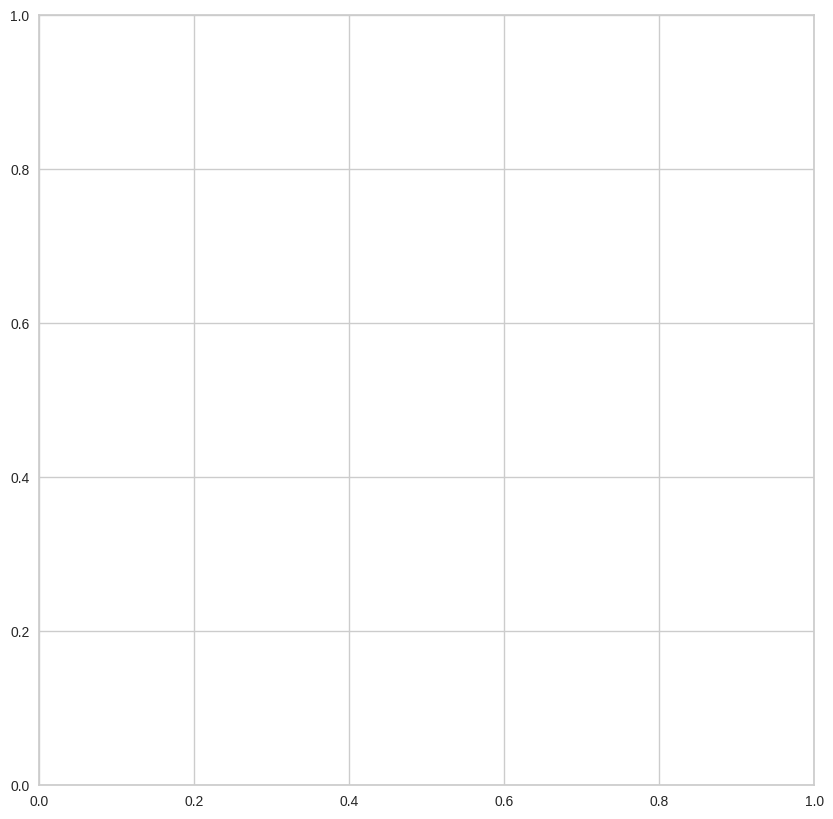

In [ ]:
attributes={
   "Fig Height": 10,
   "Fig weidth": 10,

  "Y Axis Fontsize" : 25,
  "X Axis Fontsize" : 25,

  "Y Label Fontsize" : 25,
  "X Label Fontsize" : 25,

  "Confusion Matrix Inner Fontsize": 30,
  "type"  : "Testing"

}

Conf_Mat(X_test,y_test,attributes,new_keys_6)

#Confusion Matrix for Testing ( with Percent)

In [ ]:
def Conf_Mat_percent(X_,y_,attb,keys):

  import matplotlib.pyplot as plt
  from yellowbrick.classifier import ConfusionMatrix
  import matplotlib.dates as dates

  fig = plt.figure(figsize=(attb["Fig Height"],attb["Fig weidth"]))
  ax = fig.add_subplot(111)


  for i in range(len(keys)):
    if keys[i].value ==True:
      cm = ConfusionMatrix(models[i], classes=['Control', 'Tinnitus'],fontsize=attb["Confusion Matrix Inner Fontsize"],ax=ax,percent=True,fontweight="bold")

      if str(models[i])[:3] == "XGB":
        cm.fit(X_train.values, y_train.values)
        cm.score(X_.values, y_.values)
      else:
        cm.fit(X_train, y_train)
        cm.score(X_, y_)
      cm.ax.set_title(str(models[i]), fontsize=25, fontweight="bold")
      cm.ax.set_xlabel("Predicted Class", fontsize=attb["X Axis Fontsize"],fontweight="bold")
      cm.ax.set_ylabel("True Class", fontsize=attb["Y Axis Fontsize"],fontweight="bold")
      cm.ax.xaxis.set_tick_params(labelsize=attb["X Label Fontsize"])
      cm.ax.yaxis.set_tick_params(labelsize=attb["Y Label Fontsize"])
      for label in ax.get_xticklabels():
        label.set_fontweight(550)
      for label in ax.get_yticklabels():
        label.set_fontweight(550)

      plt.savefig(attb["type"]+"_Confusion_mat("+str(models[i])+").png")
      cm.show()
      print("--------------------")
      print("--------------------")

In [ ]:
new_keys_20=models_check_box(models)

Checkbox(value=False, description='AdaBoostClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='AdaBoostClassifier(n_estimators=2, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(n_estimators=91, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, n_estimators=91, random_state=0)', …

Checkbox(value=False, description='RandomForestClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(n_estimators=1, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, n_estimators=1, random_state=0)', inden…

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='KNeighborsClassifier()', indent=False)

Checkbox(value=False, description='KNeighborsClassifier(n_neighbors=2)', indent=False)

Checkbox(value=False, description='GaussianNB()', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

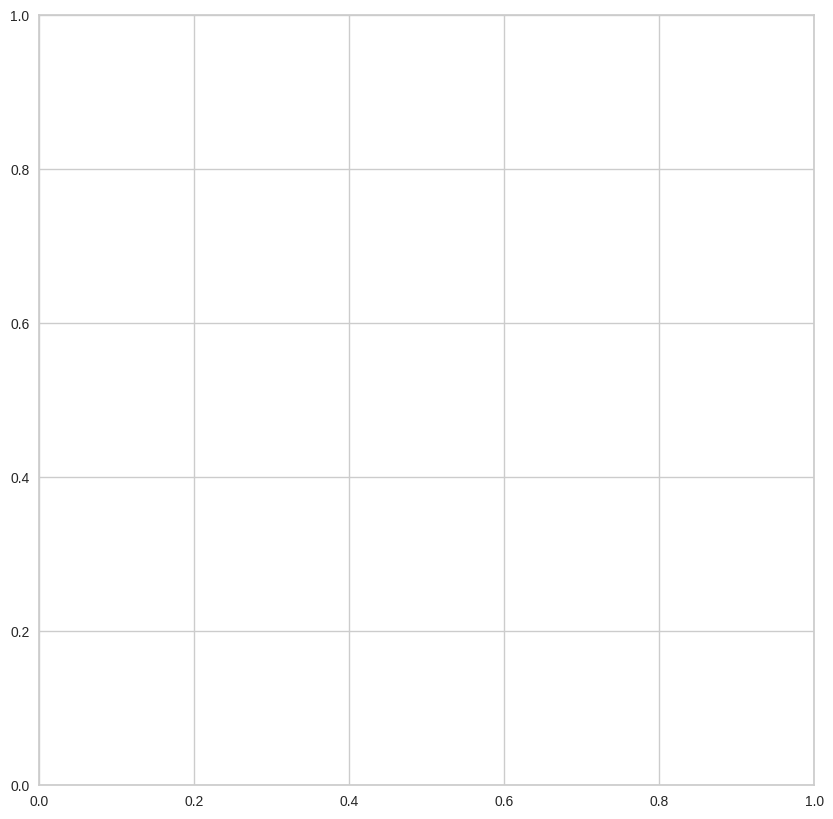

In [ ]:
attributes={
   "Fig Height": 10,
   "Fig weidth": 10,

  "Y Axis Fontsize" : 25,
  "X Axis Fontsize" : 25,

  "Y Label Fontsize" : 20,
  "X Label Fontsize" : 20,

  "Confusion Matrix Inner Fontsize": 25,
  "type"  : "Training"

}

Conf_Mat_percent(X_test,y_test,attributes,new_keys_20)

#Confusion Matrix For Training

In [ ]:
new_keys_5=models_check_box(models)

Checkbox(value=False, description='AdaBoostClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='AdaBoostClassifier(n_estimators=2, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(n_estimators=91, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, n_estimators=91, random_state=0)', …

Checkbox(value=False, description='RandomForestClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(n_estimators=1, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, n_estimators=1, random_state=0)', inden…

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='KNeighborsClassifier()', indent=False)

Checkbox(value=False, description='KNeighborsClassifier(n_neighbors=2)', indent=False)

Checkbox(value=False, description='GaussianNB()', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

In [ ]:

for i in range(len(new_keys_5)):
  if new_keys_5[i].value ==True:
    cm = ConfusionMatrix(models[i], classes=classes)

    cm.fit(X_train, y_train)
    cm.score(X_train, y_train)
    cm.show()
    print("-------------------------------")
    print("-------------------------------")

#Result CSV<br>
Predicted and Actual Row will be added at the end index

In [ ]:
def reverse_transfrom(my_list):
  for i in range(len(my_list)):
    if my_list[i] == 0:
      my_list[i] = 'Control'
    else:
      my_list[i] = 'Tinnitus'
  return my_list

In [ ]:
new_keys_4=models_check_box(models)

Checkbox(value=False, description='AdaBoostClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='AdaBoostClassifier(n_estimators=2, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(n_estimators=91, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, n_estimators=91, random_state=0)', …

Checkbox(value=False, description='RandomForestClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(n_estimators=1, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, n_estimators=1, random_state=0)', inden…

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='KNeighborsClassifier()', indent=False)

Checkbox(value=False, description='KNeighborsClassifier(n_neighbors=2)', indent=False)

Checkbox(value=False, description='GaussianNB()', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

In [ ]:
for i in range(len(new_keys_4)):
  if new_keys_4[i].value ==True:
    temp=X_test

    prediction_cls = reverse_transfrom(list(models[i].predict(X_test[0:])))
    actual_cls = reverse_transfrom(list(y_test[0:]))

    temp["Actual"] = actual_cls
    temp["Predicted"] = prediction_cls

    temp.to_csv(str(models[i])+".csv")

#ROC Comparaing Machine Learning Models

In [ ]:

def ROC(mod,X_t,y_t,graph_feat):
  r_probs = [0 for _ in range(len(y_t))]

  model_probs = []


  for i in mod:
    model_probs.append(i.predict_proba(X_t))


  model_probs2=[]

  for i in model_probs:
    model_probs2.append(i[:,1])


  from sklearn.metrics import roc_curve, roc_auc_score

  model_auc=[]
  r_auc = roc_auc_score(y_t, r_probs)

  for i in model_probs2:
    model_auc.append(roc_auc_score(y_t,i))


  fpr_tpr=[]
  r_fpr, r_tpr, _ = roc_curve(y_t, r_probs)

  for i in model_probs2:
    fpr, tpr, _ = roc_curve(y_t, i)
    fpr_tpr.append((fpr,tpr))

  import matplotlib.pyplot as plt
  plt.plot(r_fpr, r_tpr, linestyle='--', label='Random prediction (AUROC = %0.3f)' % r_auc)

  for i in range(len(model_auc)):
    plt.plot(fpr_tpr[i][0], fpr_tpr[i][1], marker='.', label=str(mod[i])+' (AUROC = %0.3f)' % model_auc[i], lw = 5)

  # Title
  plt.title('ROC Plot Testing',fontsize= graph_feat["Title Size"], fontweight=graph_feat["Title Fontweight"])
  plt.xlabel('False Positive Rate',fontweight=graph_feat["X axis Label Fontweight"],fontsize=graph_feat["X axis Label Font Size"])
  plt.ylabel('True Positive Rate',fontweight=graph_feat["Y axis Label Fontweight"],fontsize=graph_feat["Y axis Label Font Size"])

  plt.legend(
           prop = {'size' : graph_feat["legend Font Size"]},
           loc = graph_feat["legend Position"])
  plt.xticks(fontsize=20, weight = 'bold')
  plt.yticks(fontsize=20, weight = 'bold')
  fig = plt.gcf()
  fig.set_size_inches(graph_feat["Fig Width (inches)"], graph_feat["Fig Height (inches)"])
  fig.savefig(graph_feat["Fig Saving Name"], dpi=graph_feat["dpi"])
  plt.show()

***Training ROC***<br>
Chosse the Models

In [ ]:
new_keys_2=models_check_box(models)

Checkbox(value=False, description='AdaBoostClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='AdaBoostClassifier(n_estimators=2, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(n_estimators=91, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, n_estimators=91, random_state=0)', …

Checkbox(value=False, description='RandomForestClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(n_estimators=1, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, n_estimators=1, random_state=0)', inden…

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='KNeighborsClassifier()', indent=False)

Checkbox(value=False, description='KNeighborsClassifier(n_neighbors=2)', indent=False)

Checkbox(value=False, description='GaussianNB()', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)


Change  the given dictionary of graph feature for desire graph.

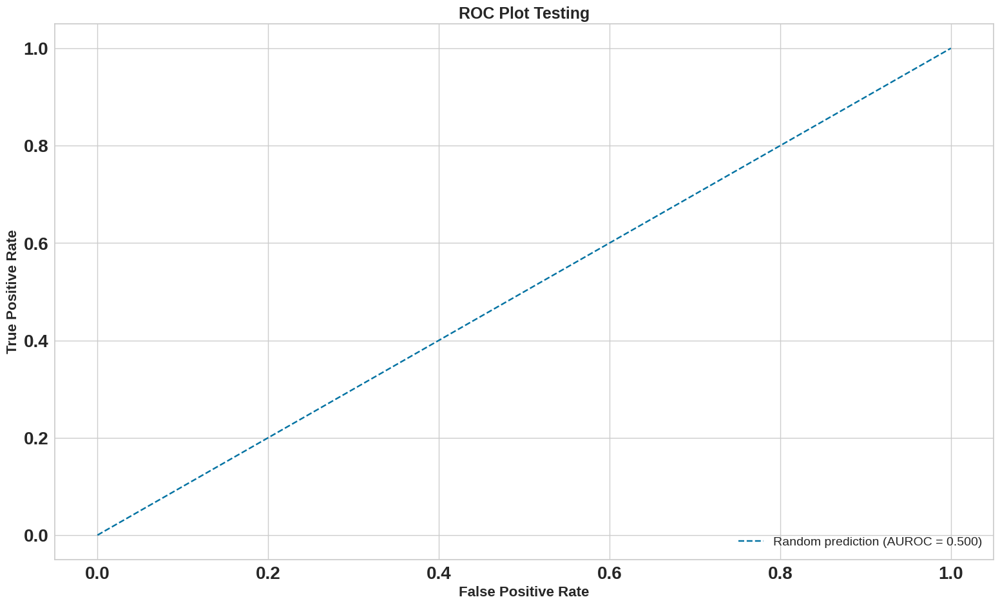

In [ ]:
graph_feat={
    "Title Size":18,
    "Title Fontweight":'bold',

    "legend Font Size": 14,
    "legend Position": "lower right",

    "X axis Label Font Size":16,
    "X axis Label Fontweight":'bold',

    "Y axis Label Font Size":16,
    "Y axis Label Fontweight":'bold',

    "Fig Height (inches)":10.8,
    "Fig Width (inches)":18.8,

    "Fig Saving Name": "ROC_training.png",
    "dpi":100

}

mod=[]
for i in range(len(new_keys_2)):
  if new_keys_2[i].value ==True:
    mod.append(models[i])

ROC(mod,X_train,y_train,graph_feat)



---



***Testing ROC***<br>
Chosse the Models

In [ ]:
new_keys_3=models_check_box(models)

Checkbox(value=False, description='AdaBoostClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='AdaBoostClassifier(n_estimators=2, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(n_estimators=91, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, n_estimators=91, random_state=0)', …

Checkbox(value=False, description='RandomForestClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(n_estimators=1, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, n_estimators=1, random_state=0)', inden…

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='KNeighborsClassifier()', indent=False)

Checkbox(value=False, description='KNeighborsClassifier(n_neighbors=2)', indent=False)

Checkbox(value=False, description='GaussianNB()', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)


Change  the given dictionary of graph feature for desire graph.

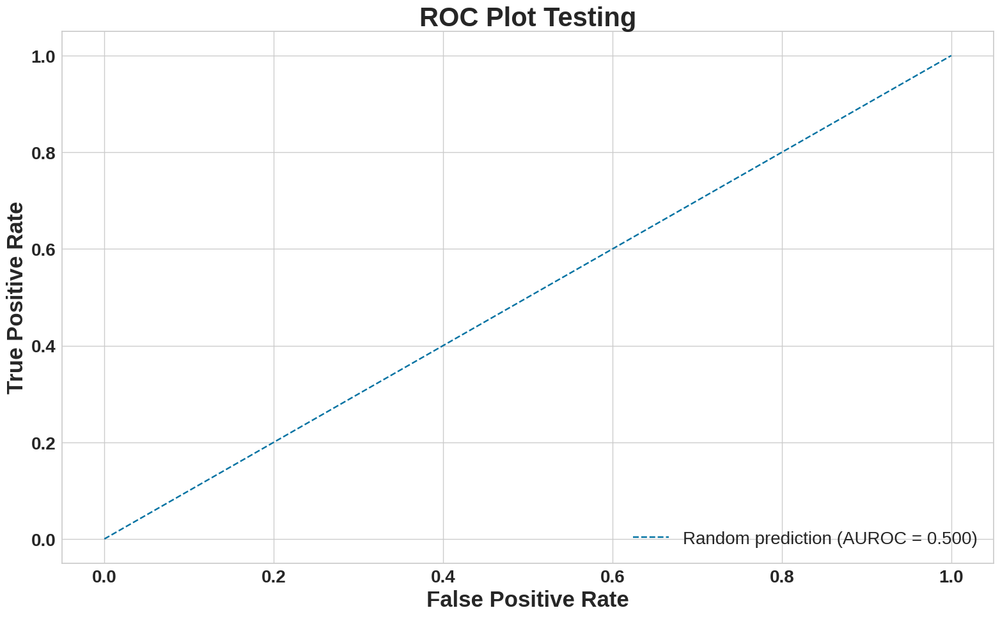

In [ ]:
graph_feat={
    "Title Size":30,
    "Title Fontweight":'bold',

    "legend Font Size": 20,
    "legend Position": "lower right",
    "legend Fontweight":'bold',

    "X axis Label Font Size":25,
    "X axis Label Fontweight":'bold',

    "Y axis Label Font Size":25,
    "Y axis Label Fontweight":'bold',

    "Fig Height (inches)":10.8,
    "Fig Width (inches)":18.8,

    "Fig Saving Name": "ROC_testing.png",
    "dpi":100

}

mod=[]
for i in range(len(new_keys_3)):
  if new_keys_3[i].value ==True:
    mod.append(models[i])

ROC(mod,X_test,y_test,graph_feat)

# **Performance Matrces_Test Dataset**

In [ ]:
model_compare = models_check_box(models)

Checkbox(value=False, description='AdaBoostClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='AdaBoostClassifier(n_estimators=2, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(n_estimators=91, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='GradientBoostingClassifier(max_depth=1, n_estimators=91, random_state=0)', …

Checkbox(value=False, description='RandomForestClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(n_estimators=1, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, random_state=0)', indent=False)

Checkbox(value=False, description='RandomForestClassifier(max_depth=2, n_estimators=1, random_state=0)', inden…

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='XGBClassifier(base_score=None, booster=None, callbacks=None,\n             …

Checkbox(value=False, description='KNeighborsClassifier()', indent=False)

Checkbox(value=False, description='KNeighborsClassifier(n_neighbors=2)', indent=False)

Checkbox(value=False, description='GaussianNB()', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

Checkbox(value=False, description='HistGradientBoostingClassifier(max_depth=1, random_state=0)', indent=False)

In [ ]:
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score,f1_score
import seaborn as sns
import matplotlib.pyplot as plt
# Create a figure with a specific size

def plot_model_comp(df):
  plt.figure(figsize=(10, 7))
  ax = sns.barplot(data=df, x=df.columns[0], y=df.columns[1])

  ax.set_xlabel("Models", fontdict={'size': 30, 'weight': 'bold'})
  ax.set_ylabel("Scores", fontdict={'size': 30, 'weight': 'bold'})
  #ax.tick_params(axis='both', which='major', labelsize=14,fontweight='bold')


  plt.yticks(fontsize=20,fontweight='bold')
  plt.xticks(fontsize=20,fontweight='bold')
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

  plt.show()







m=[]
acc=[]
precision_list=[]
recall_list=[]
f1_score_list=[]



for i in range(len(model_compare)):
  if model_compare[i].value ==True:
    y_pred = models[i].predict(X_test)
    m.append(str(models[i]).split('(')[0])
    acc.append(accuracy_score(y_pred,y_test))
    precision_list.append(precision_score(y_pred,y_test))
    recall_list.append(recall_score(y_pred,y_test))
    f1_score_list.append(f1_score(y_pred,y_test))




df_accu = {
    "Models" : m,
    "Accurecy" : acc,

}
df_accu = pd.DataFrame.from_dict(df_accu)


df_precision={
    "Models" : m,
    "Precision" : precision_list
}
df_precision = pd.DataFrame.from_dict(df_precision)

df_recall = {
    "Models" : m,
    "Recall" : recall_list
}
df_recall = pd.DataFrame.from_dict(df_recall)

df_f1_score = {
    "Models" : m,
    "f1_score" : f1_score_list
}
df_f1_score = pd.DataFrame.from_dict(df_f1_score)

##Accurecy

In [ ]:
plot_model_comp(df_accu)

ValueError: ignored

<Figure size 1000x700 with 0 Axes>

##Precision

In [ ]:
plot_model_comp(df_precision)

##Recall

In [ ]:
plot_model_comp(df_recall)

##f1_score

In [ ]:
plot_model_comp(df_f1_score)

# **Voilin Plot_K-fold CV**

In [ ]:
from sklearn.model_selection import cross_validate
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score,f1_score

scoring = {'accuracy' : make_scorer(accuracy_score),
           'precision' : make_scorer(precision_score),
           'recall' : make_scorer(recall_score),
           'f1_score' : make_scorer(f1_score)}


k=10
for i in result:
  print(i[0]," -> Accuracy: ",result[i])
  #l=list(cross_val_score(i[0],X_new.iloc[:,1:], y_new,cv=k, scoring=scoring))
  #avg=sum(l)/k
  outcome = cross_validate(i[0],X_new.iloc[:,1:], y_new,cv=k, scoring=scoring)
  #print(i[0]," -> AVG Accurecy After CV: "+str(avg)+ " (For "+str(k)+" Fold)")
  print(i[0], outcome)
  print("--------------------------------------------------------------------------")

In [ ]:
vio_plot_key=models_check_box(models)

In [ ]:



k =10
mod_outcomes = []
for i in range(len(vio_plot_key)):
  if vio_plot_key[i].value ==True:
    mod_outcomes.append((str(models[i]).split('(')[0],cross_validate(models[i],X_new.iloc[:,1:], y_new,cv=k, scoring=scoring)))

mat_dic={
    'test_accuracy': "Accuracy",
    'test_precision':"Precision",
    'test_recall':"Recall",
    'test_f1_score':"F1-Score"
}



m = []
matrics = []
mat_score = []



for i in mod_outcomes:
  for j in i[1]:
    for l in i[1][j]:
      if j in mat_dic.keys():
        m.append(i[0])
        matrics.append(mat_dic[j])
        mat_score.append(l)


df={
    "Models" : m,
    "Matrics": matrics,
    "Scores":mat_score
}

df = pd.DataFrame.from_dict(df)




import seaborn as sns
import matplotlib.pyplot as plt
# Create a figure with a specific size
plt.figure(figsize=(20, 8))


ax = sns.violinplot(data=df, x="Matrics", y="Scores", hue="Models")


ax.set_xlabel("Cross-validation Performance Matrics", fontdict={'size': 20, 'weight': 'bold'})
ax.set_ylabel("Scores", fontdict={'size': 20, 'weight': 'bold'})
#ax.tick_params(axis='both', which='major', labelsize=14,fontweight='bold')


plt.yticks(fontsize=15,fontweight='bold')
plt.xticks(fontsize=15,fontweight='bold')

plt.legend(title='Models',fontsize= 10)


plt.show()




# **CV_ROC**

In [ ]:


def CV_ROC(model,folds,graph_feat):
  import matplotlib.pyplot as plt

  from sklearn import svm
  from sklearn.metrics import auc,roc_curve
  from sklearn.metrics import RocCurveDisplay
  from sklearn.model_selection import StratifiedKFold


  cv = StratifiedKFold(n_splits=folds)



  tprs = []
  aucs = []
  mean_fpr = np.linspace(0,1,100)
  i = 1
  for train,test in cv.split(X_new.iloc[:,1:], y_new.values):
      prediction = model.fit(X_new.iloc[:,1:].values[train], y_new.values[train]).predict_proba(X_new.iloc[:,1:].values[test])
      fpr, tpr, t = roc_curve(y_new.values[test], prediction[:, 1])
      tprs.append(np.interp(mean_fpr, fpr, tpr))
      roc_auc = auc(fpr, tpr)
      aucs.append(roc_auc)
      plt.plot(fpr, tpr, lw=5, alpha=0.3, label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))
      i= i+1

  plt.plot([0,1],[0,1],linestyle = '--',lw = 5,color = 'black')
  mean_tpr = np.mean(tprs, axis=0)
  mean_auc = auc(mean_fpr, mean_tpr)
  plt.plot(mean_fpr, mean_tpr, color='blue',
          label=r'Mean ROC (AUC = %0.2f )' % (mean_auc),lw=2, alpha=1)

  plt.title('CV-ROC-> '+str(model),fontsize= graph_feat["Title Size"], fontweight=graph_feat["Title Fontweight"])
  plt.xlabel('False Positive Rate',fontweight=graph_feat["X axis Label Fontweight"],fontsize=graph_feat["X axis Label Font Size"])
  plt.ylabel('True Positive Rate',fontweight=graph_feat["Y axis Label Fontweight"],fontsize=graph_feat["Y axis Label Font Size"])
  plt.legend(
           prop = {'size' : graph_feat["legend Font Size"]},
           loc = graph_feat["legend Position"])
  plt.xticks(fontsize=25, weight = 'bold')
  plt.yticks(fontsize=25, weight = 'bold')
  fig = plt.gcf()
  fig.set_size_inches(graph_feat["Fig Width (inches)"], graph_feat["Fig Height (inches)"])
  fig.savefig(graph_feat["Fig Saving Name"], dpi=graph_feat["dpi"])
  plt.show()

In [ ]:
new_keys=models_check_box(models)

<font color="apple green">Just mark the above cell to select the Multiple Algorithms for ROC CV graph. <font color="sky blue"><b>Then run the cell below after selecting.</b></font> You do not need to run above cell everytime...</font><font color='red'><b>Do not run above cell after selecting</b></font>

In [ ]:
# run this cell after selecting

graph_feat={
    "Title Size":30,
    "Title Fontweight":'bold',

    "legend Font Size": 20,
    "legend Position": "lower right",

    "X axis Label Font Size":25,
    "X axis Label Fontweight":'bold',

    "Y axis Label Font Size":25,
    "Y axis Label Fontweight":'bold',

    "Fig Height (inches)":10.8,
    "Fig Width (inches)":18.8,

    "Fig Saving Name": "ROC_testing.png",
    "dpi":100

}





k_fold=10

for i in range(len(new_keys)):
  if new_keys[i].value ==True:
    CV_ROC(models[i],10,graph_feat)
    print("-----------------------------------------------------------------")
    print("-----------------------------------------------------------------")

# **LIME**

In [ ]:
!pip install lime

In [ ]:

def LIME_EXP(model,row):
  import lime
  from lime import lime_tabular


  if str(model)[:3] == "XGB":

    '''
    explainer = lime.lime_tabular.LimeTabularExplainer(
      X_train.values,
      feature_names=list(list(X_new.columns)),
      class_names=['Reading', 'Resting', 'Walking', 'Working']
      )

    exp = explainer.explain_instance(X_test.iloc[row, :].values,
                                model.predict_proba,
                                num_features=6,
                                top_labels=2)'''
    print("Plz RUN XGboost cell....")
    return None

  else:
    explainer = lime_tabular.LimeTabularExplainer(
      training_data=np.array(X_train),
      feature_names=list(X_new.columns),
      class_names=['Control', 'Tinnitus'],
      mode='classification'
      )

    exp = explainer.explain_instance(X_test.iloc[row],
                                    model.predict_proba,
                                    num_features=6,
                                    top_labels=4)



  #exp.show_in_notebook(show_table=True, show_all=True)
  exp.show_in_notebook(show_table=True)


  import matplotlib.pyplot as plt
  with plt.style.context("ggplot"):
      exp.as_pyplot_figure()


  from IPython.display import HTML
  html_data = exp.as_html()
  HTML(data=html_data)

  exp.save_to_file(str(model)+".html")

In [ ]:
row = int(input("Enter the index of row to explain: "))      # the index of row to be explained in LIME

In [ ]:

new_keys_8=models_check_box(models)

In [ ]:
for i in range(len(new_keys_8)):
  if new_keys_8[i].value ==True:
    print(models[i])
    LIME_EXP(models[i],row)
    print("---------------------------------------------------------")
    print("---------------------------------------------------------")
    print("---------------------------------------------------------")
    print("---------------------------------------------------------")

### LIME for XGboost

In [ ]:
row = 18  ## the index of row to be explained in LIME

import lime
from lime import lime_tabular
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values,
                                                   feature_names=list(list(X_new.columns)),
                                                   class_names=['Control', 'Tinnitus'])

####Default

In [ ]:

exp = explainer.explain_instance(X_test.iloc[row, :].values,
                                 xgb_deafult.predict_proba,
                                 num_features=6,
                                 top_labels=4)

exp.show_in_notebook(show_table=True, show_all=False)

import matplotlib.pyplot as plt
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()


from IPython.display import HTML
html_data = exp.as_html()
HTML(data=html_data)

exp.save_to_file("xgb_deafult.html")

####Best Max Depth

In [ ]:

exp = explainer.explain_instance(X_test.iloc[row, :].values,
                                 xgb_depth.predict_proba,
                                 num_features=6,
                                 top_labels=4)

exp.show_in_notebook(show_table=True, show_all=False)

import matplotlib.pyplot as plt
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()


from IPython.display import HTML
html_data = exp.as_html()
HTML(data=html_data)

exp.save_to_file("xgb_depth.html")

####Best N Estimator

In [ ]:


exp = explainer.explain_instance(X_test.iloc[row, :].values,
                                 xgb_estimator.predict_proba,
                                 num_features=6,
                                 top_labels=4)

exp.show_in_notebook(show_table=True, show_all=False)

import matplotlib.pyplot as plt
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()


from IPython.display import HTML
html_data = exp.as_html()
HTML(data=html_data)

exp.save_to_file("xgb_estimator.html")

####Best Depth and Best Estimator

In [ ]:

exp = explainer.explain_instance(X_test.iloc[row, :].values,
                                 xgb_all.predict_proba,
                                 num_features=6,
                                 top_labels=4)

exp.show_in_notebook(show_table=True, show_all=False)


import matplotlib.pyplot as plt
with plt.style.context("ggplot"):
    exp.as_pyplot_figure()


from IPython.display import HTML
html_data = exp.as_html()
HTML(data=html_data)

exp.save_to_file("xgb_all.html")